# Build a Conditional GAN

### Goals
In this notebook, you're going to make a conditional GAN in order to generate hand-written images of digits, conditioned on the digit to be generated (the class vector). This will let you choose what digit you want to generate.

You'll then do some exploration of the generated images to visualize what the noise and class vectors mean.  

### Learning Objectives
1.   Learn the technical difference between a conditional and unconditional GAN.
2.   Understand the distinction between the class and noise vector in a conditional GAN.



## Getting Started

For this assignment, you will be using the MNIST dataset again, but there's nothing stopping you from applying this generator code to produce images of animals conditioned on the species or pictures of faces conditioned on facial characteristics.

Note that this assignment requires no changes to the architectures of the generator or discriminator, only changes to the data passed to both. The generator will no longer take `z_dim` as an argument, but  `input_dim` instead, since you need to pass in both the noise and class vectors. In addition to good variable naming, this also means that you can use the generator and discriminator code you have previously written with different parameters.

You will begin by importing the necessary libraries and building the generator and discriminator.

#### Packages and Visualization

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for our testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

#### Generator and Noise

In [3]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        input_dim: the dimension of the input vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, input_dim)
        '''
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, input_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        input_dim: the dimension of the input vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, input_dim, device=device)

#### Discriminator

In [4]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
      im_chan: the number of channels in the images, fitted for the dataset used, a scalar
            (MNIST is black-and-white, so 1 channel is your default)
      hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of the DCGAN; 
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

## Class Input

In conditional GANs, the input vector for the generator will also need to include the class information. The class is represented using a one-hot encoded vector where its length is the number of classes and each index represents a class. The vector is all 0's and a 1 on the chosen class. Given the labels of multiple images (e.g. from a batch) and number of classes, please create one-hot vectors for each label. There is a class within the PyTorch functional library that can help you.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">get_one_hot_labels</font></code></b>
</font>
</summary>

1.   This code can be done in one line.
2.   The documentation for [F.one_hot](https://pytorch.org/docs/stable/nn.functional.html#torch.nn.functional.one_hot) may be helpful.

</details>


In [5]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_one_hot_labels

import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    '''
    Function for creating one-hot vectors for the labels, returns a tensor of shape (?, num_classes).
    Parameters:
        labels: tensor of labels from the dataloader, size (?)
        n_classes: the total number of classes in the dataset, an integer scalar
    '''
    #### START CODE HERE ####
    return F.one_hot(labels,num_classes=n_classes)
    #### END CODE HERE ####

In [6]:
assert (
    get_one_hot_labels(
        labels=torch.Tensor([[0, 2, 1]]).long(),
        n_classes=3
    ).tolist() == 
    [[
      [1, 0, 0], 
      [0, 0, 1], 
      [0, 1, 0]
    ]]
)
print("Success!")

Success!


Next, you need to be able to concatenate the one-hot class vector to the noise vector before giving it to the generator. You will also need to do this when adding the class channels to the discriminator.

To do this, you will need to write a function that combines two vectors. Remember that you need to ensure that the vectors are the same type: floats. Again, you can look to the PyTorch library for help.
<details>
<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">combine_vectors</font></code></b>
</font>
</summary>

1.   This code can also be written in one line.
2.   The documentation for [torch.cat](https://pytorch.org/docs/master/generated/torch.cat.html) may be helpful.
3.   Specifically, you might want to look at what the `dim` argument of `torch.cat` does.

</details>


In [16]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: combine_vectors
def combine_vectors(x, y):
    '''
    Function for combining two vectors with shapes (n_samples, ?) and (n_samples, ?).
    Parameters:
      x: (n_samples, ?) the first vector. 
        In this assignment, this will be the noise vector of shape (n_samples, z_dim), 
        but you shouldn't need to know the second dimension's size.
      y: (n_samples, ?) the second vector.
        Once again, in this assignment this will be the one-hot class vector 
        with the shape (n_samples, n_classes), but you shouldn't assume this in your code.
    '''
    # Note: Make sure this function outputs a float no matter what inputs it receives
    #### START CODE HERE ####
    combined = torch.cat((x.float(),y.float()),axis=1)
    #### END CODE HERE ####
    return combined

In [17]:
combined = combine_vectors(torch.tensor([[1, 2], [3, 4]]), torch.tensor([[5, 6], [7, 8]]));
# Check exact order of elements
assert torch.all(combined == torch.tensor([[1, 2, 5, 6], [3, 4, 7, 8]]))
# Tests that items are of float type
assert (type(combined[0][0].item()) == float)
# Check shapes
combined = combine_vectors(torch.randn(1, 4, 5), torch.randn(1, 8, 5));
assert tuple(combined.shape) == (1, 12, 5)
assert tuple(combine_vectors(torch.randn(1, 10, 12).long(), torch.randn(1, 20, 12).long()).shape) == (1, 30, 12)
print("Success!")

Success!


## Training
Now you can start to put it all together!
First, you will define some new parameters:

*   mnist_shape: the number of pixels in each MNIST image, which has dimensions 28 x 28 and one channel (because it's black-and-white) so 1 x 28 x 28
*   n_classes: the number of classes in MNIST (10, since there are the digits from 0 to 9)

In [21]:
mnist_shape = (1, 28, 28)
n_classes = 10

And you also include the same parameters from previous assignments:

  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type


In [22]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, discriminator, and optimizers. To do this, you will need to update the input dimensions for both models. For the generator, you will need to calculate the size of the input vector; recall that for conditional GANs, the generator's input is the noise vector concatenated with the class vector. For the discriminator, you need to add a channel for every class.

In [23]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_input_dimensions
def get_input_dimensions(z_dim, mnist_shape, n_classes):
    '''
    Function for getting the size of the conditional input dimensions 
    from z_dim, the image shape, and number of classes.
    Parameters:
        z_dim: the dimension of the noise vector, a scalar
        mnist_shape: the shape of each MNIST image as (C, W, H), which is (1, 28, 28)
        n_classes: the total number of classes in the dataset, an integer scalar
                (10 for MNIST)
    Returns: 
        generator_input_dim: the input dimensionality of the conditional generator, 
                          which takes the noise and class vectors
        discriminator_im_chan: the number of input channels to the discriminator
                            (e.g. C x 28 x 28 for MNIST)
    '''
    #### START CODE HERE ####
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = mnist_shape[0] + n_classes
    #### END CODE HERE ####
    return generator_input_dim, discriminator_im_chan

In [24]:
def test_input_dims():
    gen_dim, disc_dim = get_input_dimensions(23, (12, 23, 52), 9)
    assert gen_dim == 32
    assert disc_dim == 21
test_input_dims()
print("Success!")

Success!


In [25]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, mnist_shape, n_classes)

gen = Generator(input_dim=generator_input_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(im_chan=discriminator_im_chan).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

Now to train, you would like both your generator and your discriminator to know what class of image should be generated. There are a few locations where you will need to implement code.

For example, if you're generating a picture of the number "1", you would need to:
  
1.   Tell that to the generator, so that it knows it should be generating a "1"
2.   Tell that to the discriminator, so that it knows it should be looking at a "1". If the discriminator is told it should be looking at a 1 but sees something that's clearly an 8, it can guess that it's probably fake

There are no explicit unit tests here -- if this block of code runs and you don't change any of the other variables, then you've done it correctly!

Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!



Step 500: Generator loss: 2.2879033873081207, discriminator loss: 0.2797559417374432


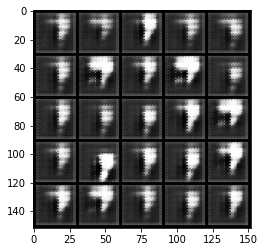

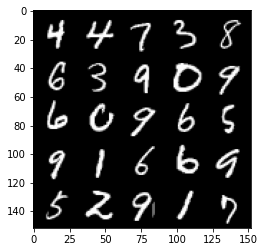

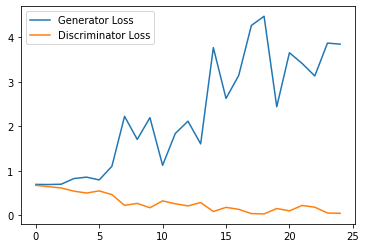

Step 1000: Generator loss: 2.9696891281604767, discriminator loss: 0.13854222930036486


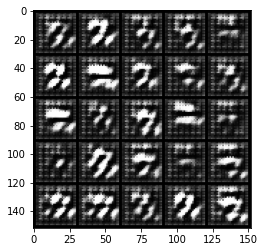

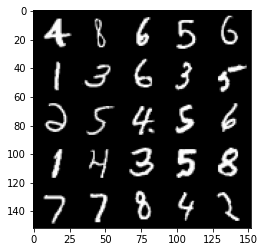

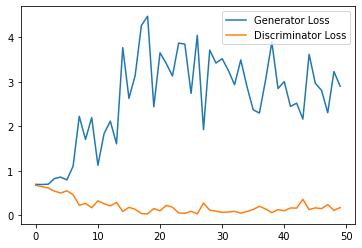

Step 1500: Generator loss: 2.9600361490249636, discriminator loss: 0.15456632777303458


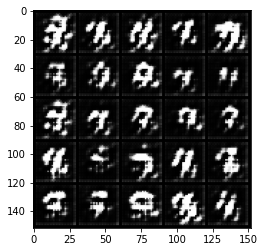

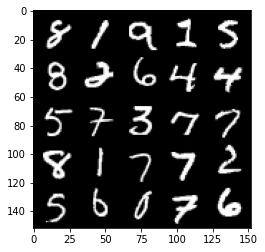

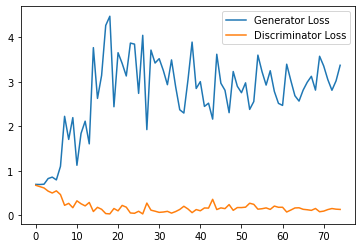

Step 2000: Generator loss: 2.7660639083385465, discriminator loss: 0.2360392886325717


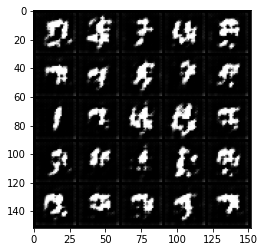

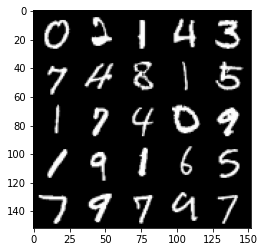

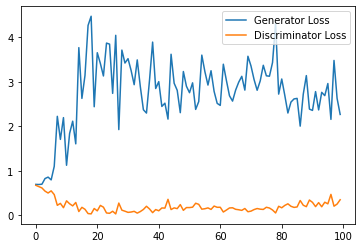

Step 2500: Generator loss: 2.0910789785385133, discriminator loss: 0.30694320651888846


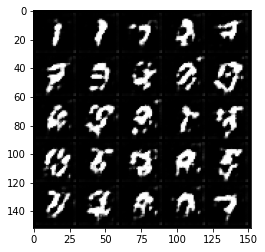

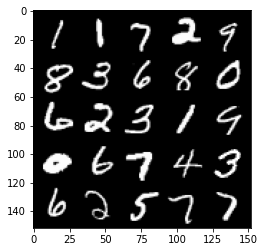

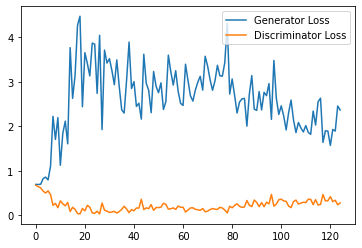

Step 3000: Generator loss: 2.1117853698730467, discriminator loss: 0.32083849400281905


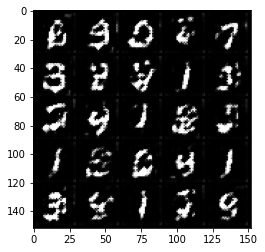

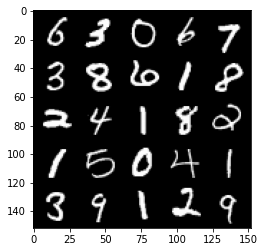

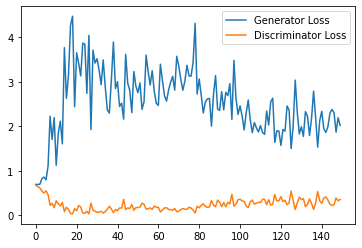

Step 3500: Generator loss: 2.081719213247299, discriminator loss: 0.32358923813700674


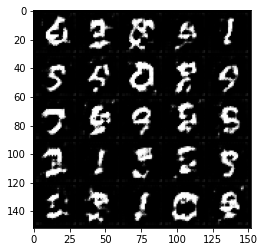

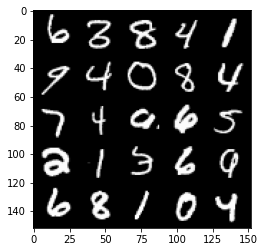

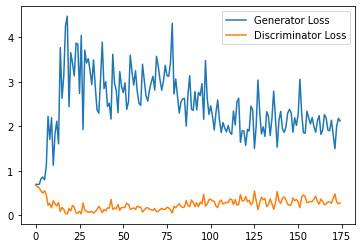

Step 4000: Generator loss: 2.1108526537418366, discriminator loss: 0.3297070272266865


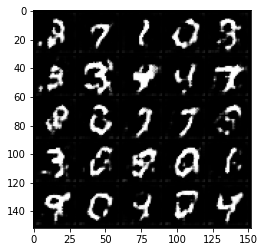

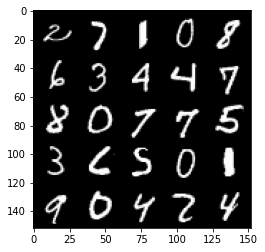

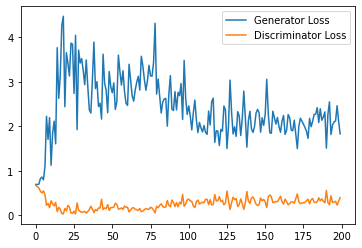

Step 4500: Generator loss: 1.9118932497501373, discriminator loss: 0.3687626961767673


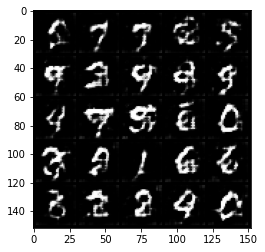

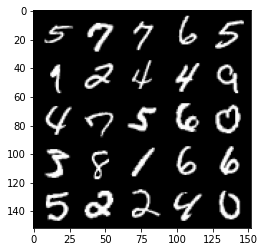

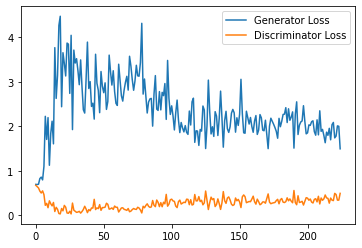

Step 5000: Generator loss: 1.7521980946063995, discriminator loss: 0.3904684012532234


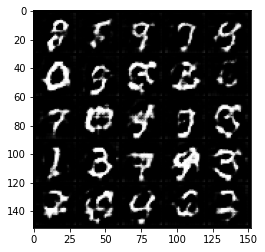

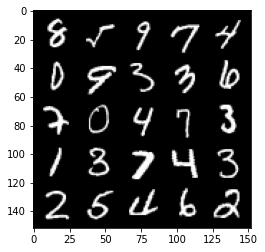

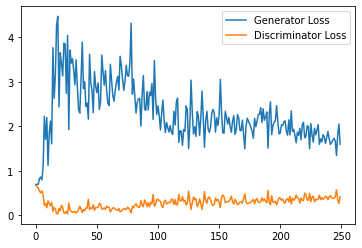

Step 5500: Generator loss: 1.6706306602954863, discriminator loss: 0.39564652410149576


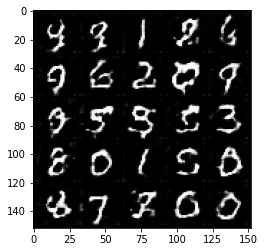

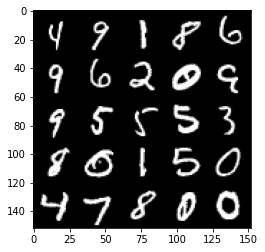

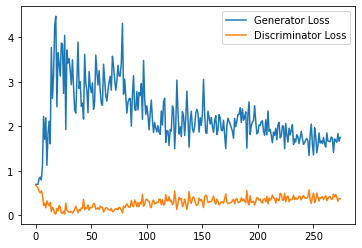

Step 6000: Generator loss: 1.5955552512407303, discriminator loss: 0.4496213790178299


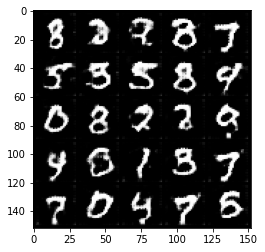

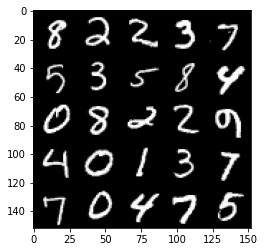

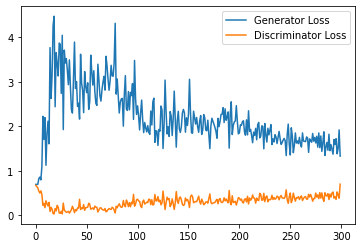

Step 6500: Generator loss: 1.5585028448104858, discriminator loss: 0.44545189729332924


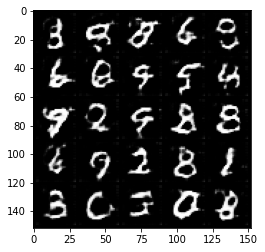

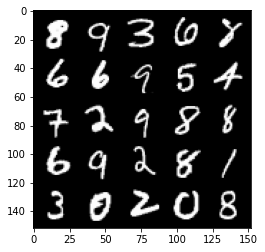

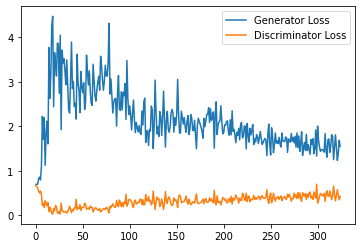

Step 7000: Generator loss: 1.435156898856163, discriminator loss: 0.478282695710659


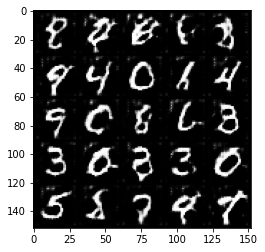

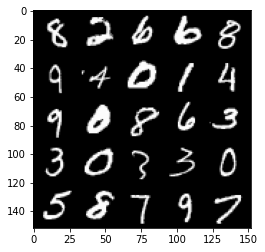

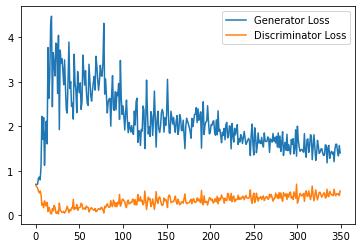

Step 7500: Generator loss: 1.4699486141204834, discriminator loss: 0.4896211287975311


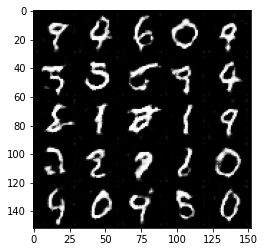

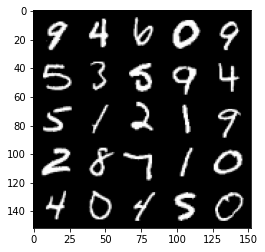

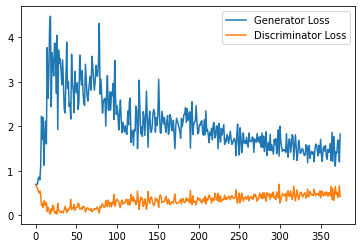

Step 8000: Generator loss: 1.3302766917943953, discriminator loss: 0.514370703279972


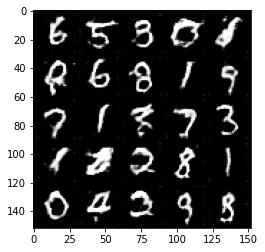

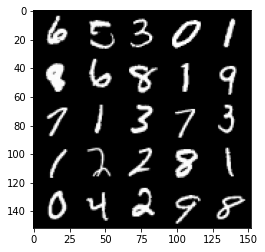

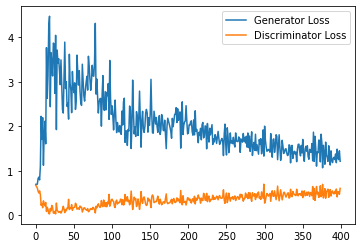

Step 8500: Generator loss: 1.3147097787857056, discriminator loss: 0.5113320035934448


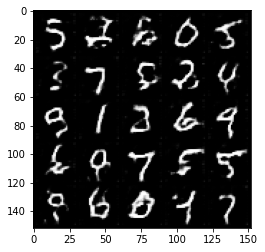

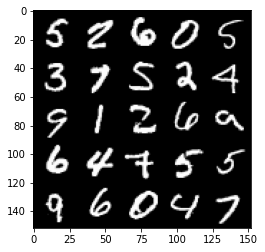

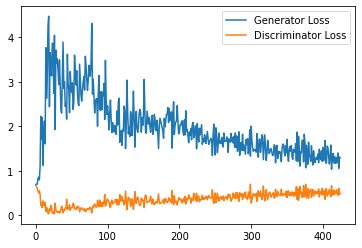

Step 9000: Generator loss: 1.2694577955007553, discriminator loss: 0.530353769659996


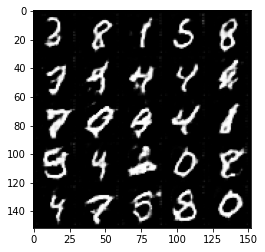

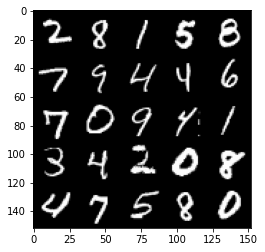

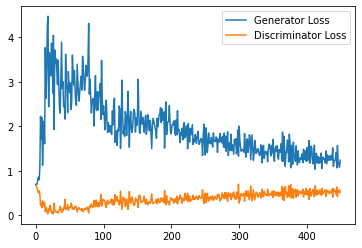

Step 9500: Generator loss: 1.1856364142894744, discriminator loss: 0.5371607049107552


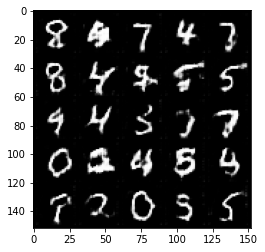

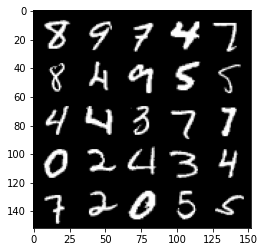

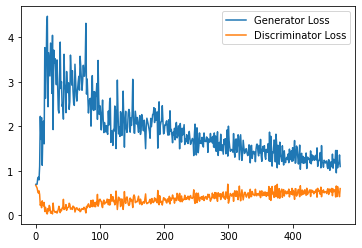

Step 10000: Generator loss: 1.2183446156978608, discriminator loss: 0.5549882592558861


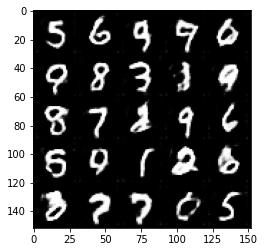

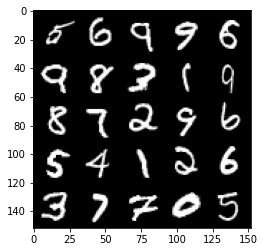

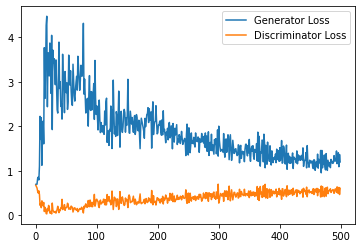

Step 10500: Generator loss: 1.1706662203073501, discriminator loss: 0.5505335114002228


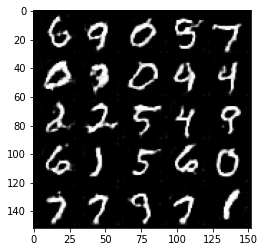

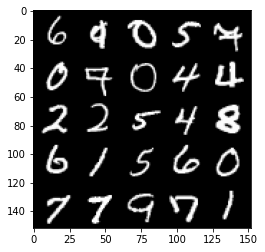

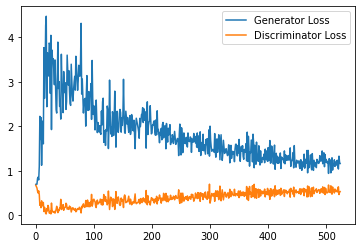

Step 11000: Generator loss: 1.1269616907835007, discriminator loss: 0.5638991241455078


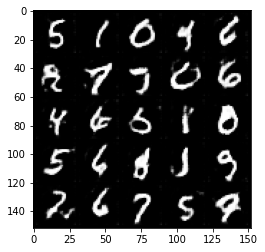

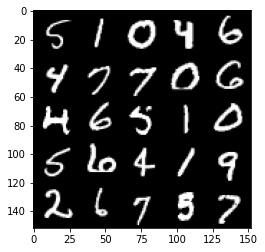

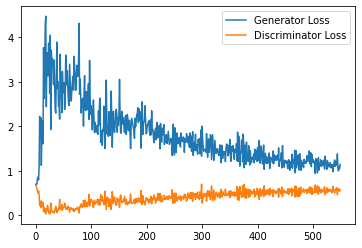

Step 11500: Generator loss: 1.0790801960229874, discriminator loss: 0.574667705476284


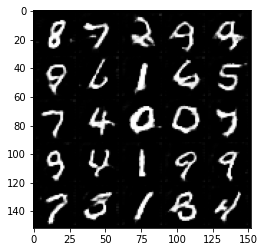

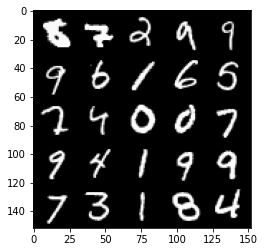

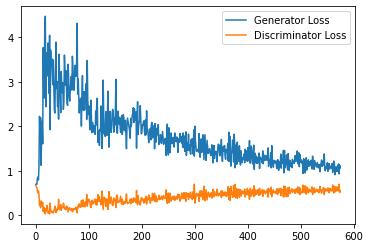

Step 12000: Generator loss: 1.0859160846471787, discriminator loss: 0.5780903697013855


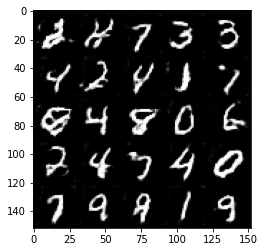

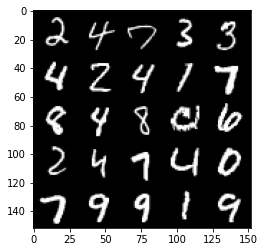

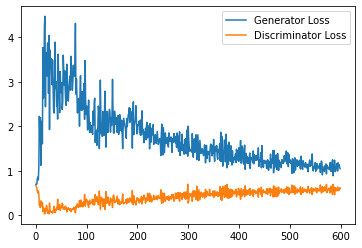

Step 12500: Generator loss: 1.0875735042095185, discriminator loss: 0.585076052069664


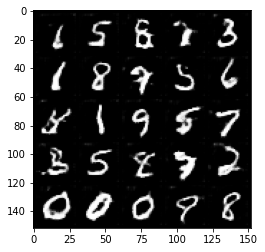

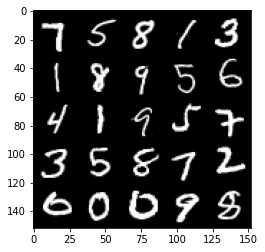

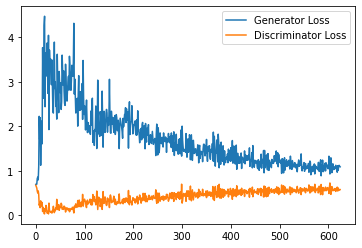

Step 13000: Generator loss: 1.096056762456894, discriminator loss: 0.5902123172879219


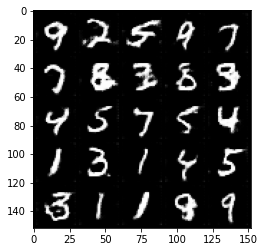

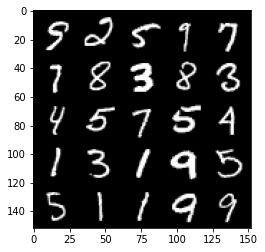

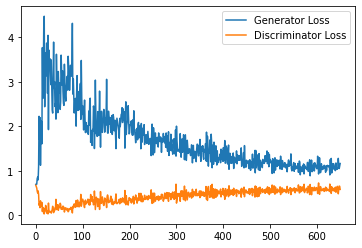

Step 13500: Generator loss: 1.1162146804332733, discriminator loss: 0.5913583019375801


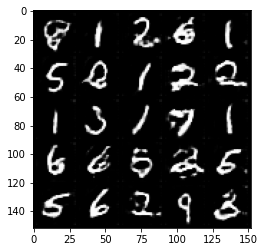

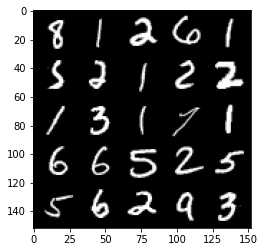

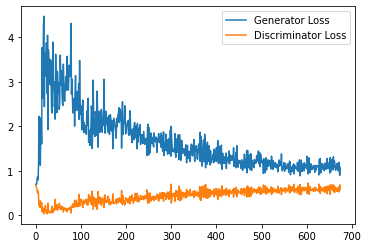

Step 14000: Generator loss: 1.0763369266986846, discriminator loss: 0.5851902943253517


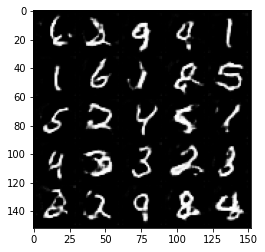

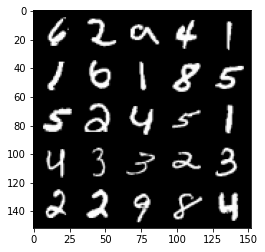

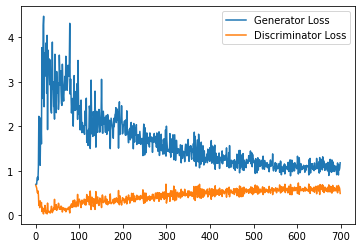

Step 14500: Generator loss: 1.0417315658330917, discriminator loss: 0.5965889561772346


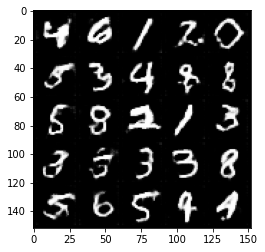

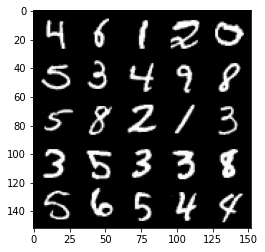

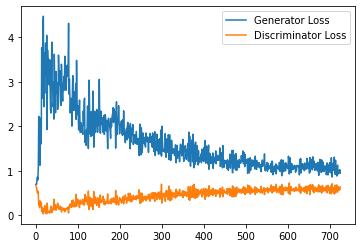

Step 15000: Generator loss: 1.0141035710573196, discriminator loss: 0.5969731637835503


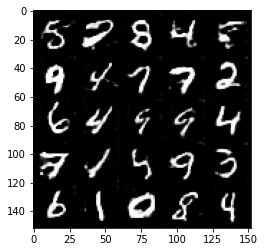

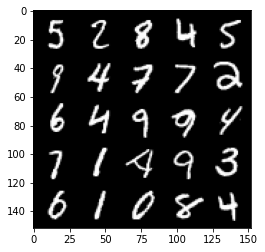

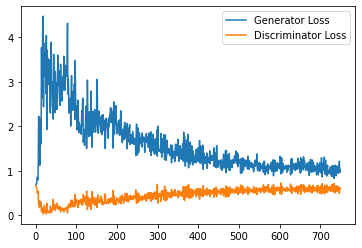

Step 15500: Generator loss: 1.0668649842739106, discriminator loss: 0.6044786684513092


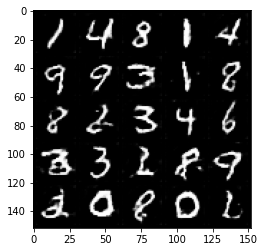

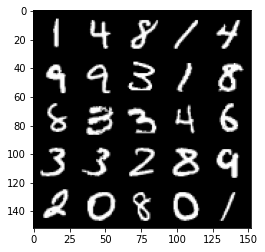

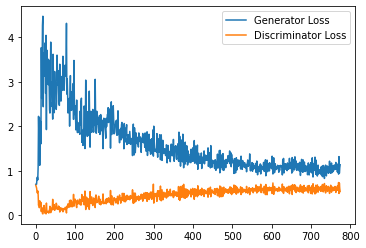

Step 16000: Generator loss: 1.0513797060251235, discriminator loss: 0.603523081958294


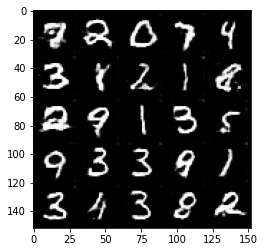

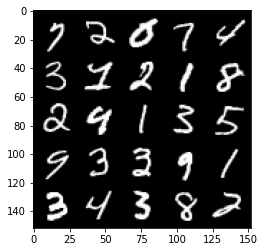

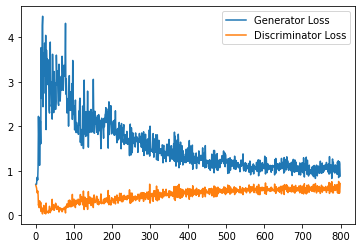

Step 16500: Generator loss: 0.9868418817520141, discriminator loss: 0.5998979867100716


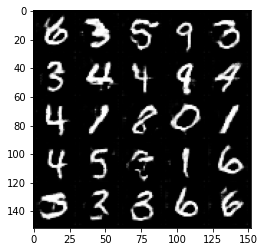

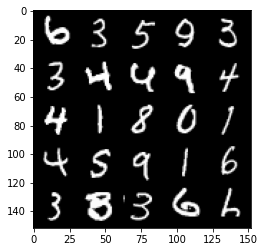

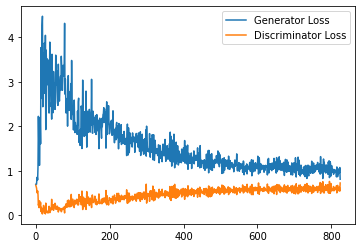

Step 17000: Generator loss: 1.050162388086319, discriminator loss: 0.5927122491598129


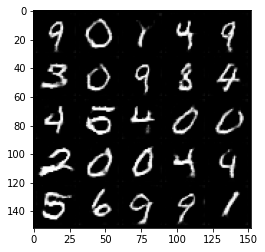

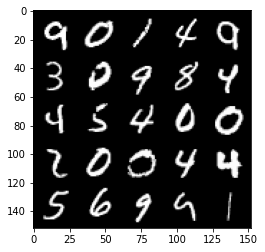

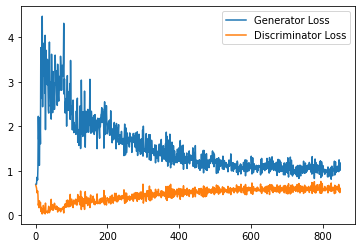

Step 17500: Generator loss: 1.0246773867607117, discriminator loss: 0.5994537524580955


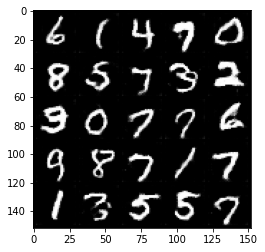

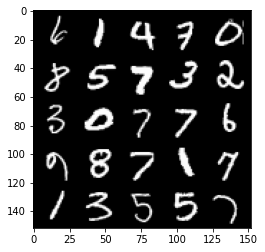

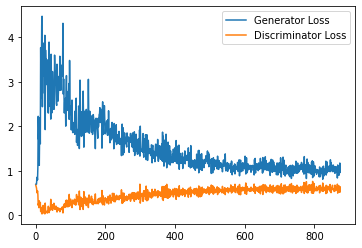

Step 18000: Generator loss: 1.0015565292835236, discriminator loss: 0.5964683253765106


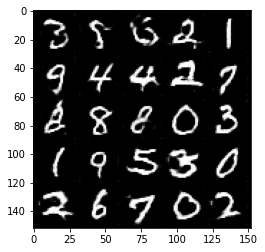

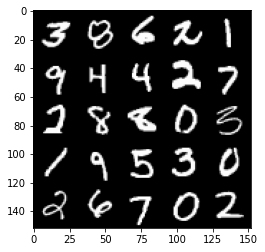

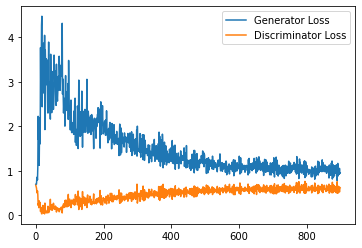

Step 18500: Generator loss: 1.0412891700267792, discriminator loss: 0.5981632815003395


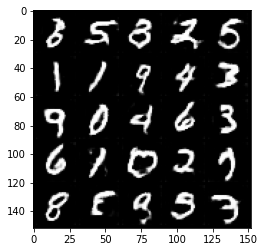

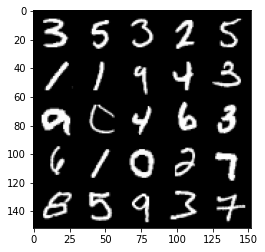

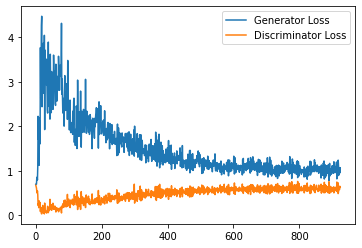

Step 19000: Generator loss: 1.0130034012794495, discriminator loss: 0.5925543718934059


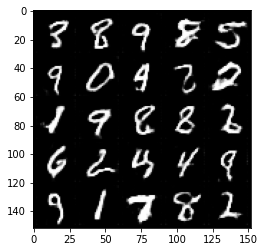

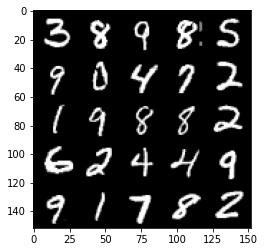

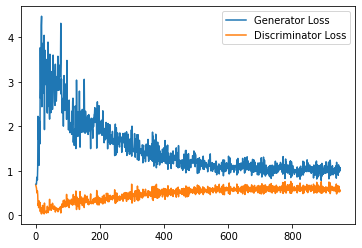

Step 19500: Generator loss: 1.0178597987890243, discriminator loss: 0.6041032211184502


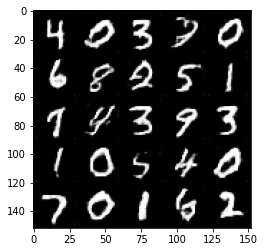

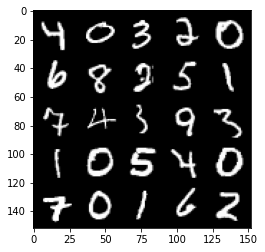

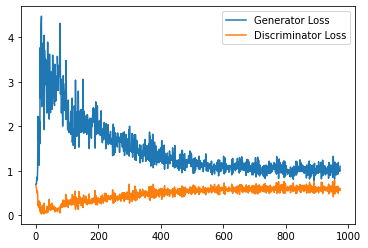

Step 20000: Generator loss: 1.0163773804903031, discriminator loss: 0.5957547077536582


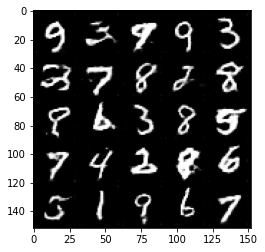

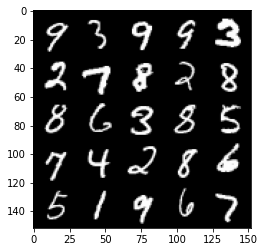

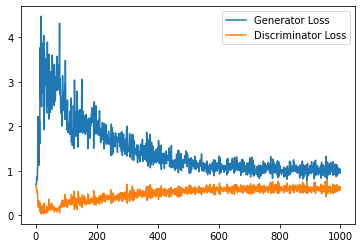

Step 20500: Generator loss: 0.9905612832307815, discriminator loss: 0.5946380260586739


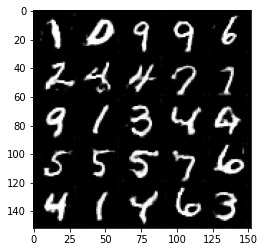

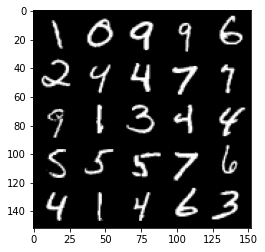

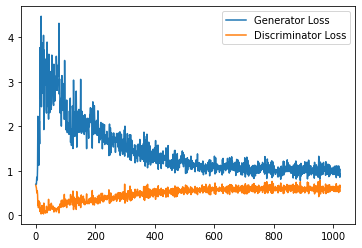

Step 21000: Generator loss: 0.9818992131948471, discriminator loss: 0.6019809822440148


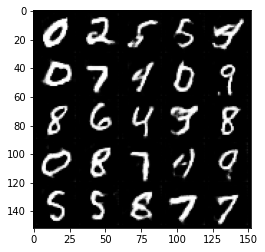

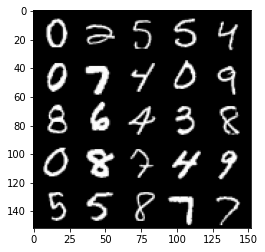

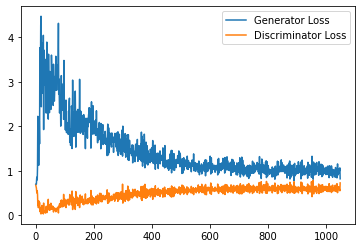

Step 21500: Generator loss: 0.999317077755928, discriminator loss: 0.6096575630903244


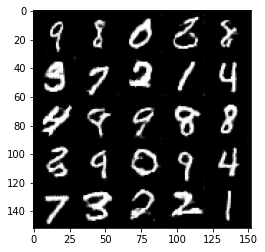

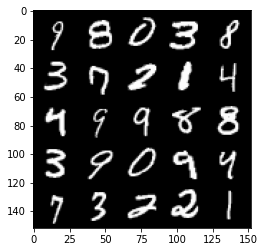

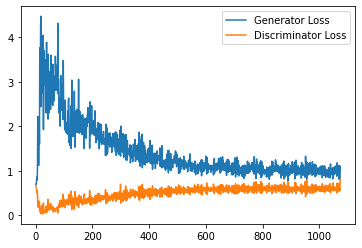

Step 22000: Generator loss: 0.9907261253595352, discriminator loss: 0.5986356902718544


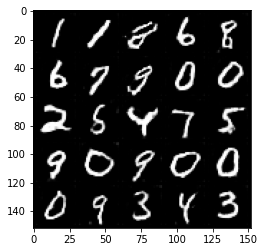

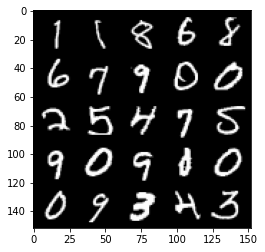

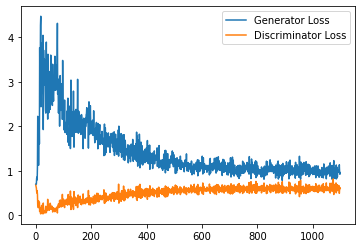

Step 22500: Generator loss: 0.9862922970056534, discriminator loss: 0.6038322948813438


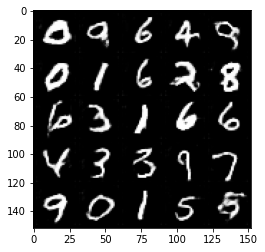

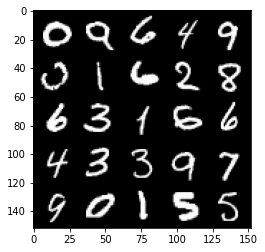

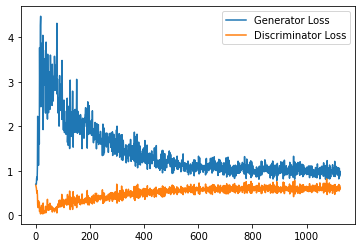

Step 23000: Generator loss: 0.9658707667589188, discriminator loss: 0.6104805713295937


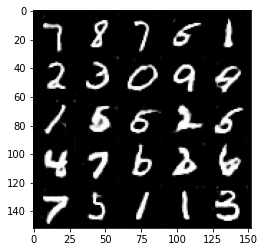

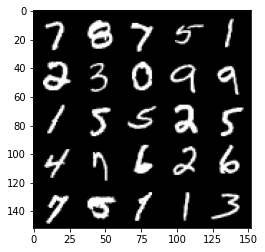

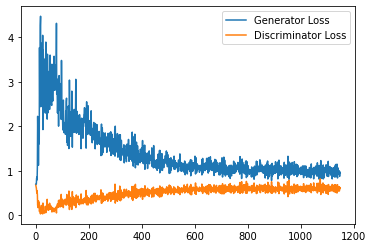

Step 23500: Generator loss: 0.9847574603557586, discriminator loss: 0.609201144695282


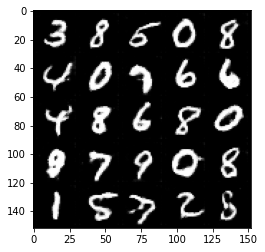

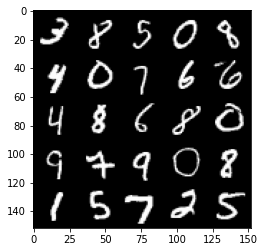

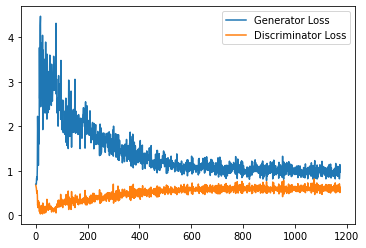

Step 24000: Generator loss: 0.9971813905239105, discriminator loss: 0.6060648477077484


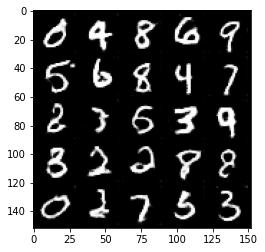

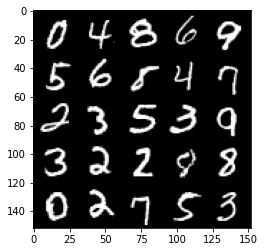

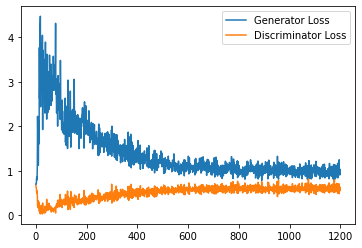

Step 24500: Generator loss: 0.9602633193731308, discriminator loss: 0.6098213702440262


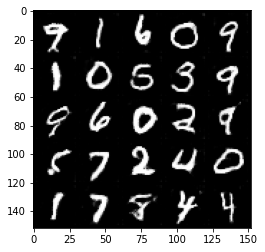

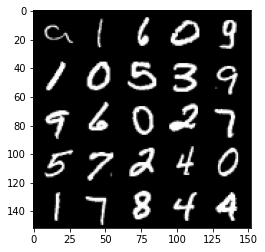

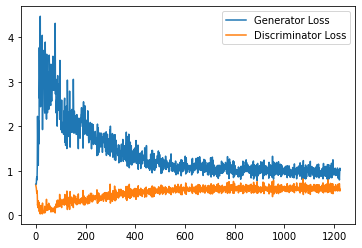

Step 25000: Generator loss: 0.9676429810523987, discriminator loss: 0.6089971644878387


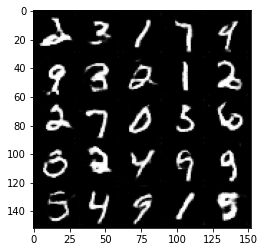

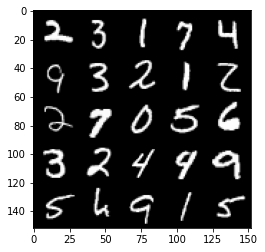

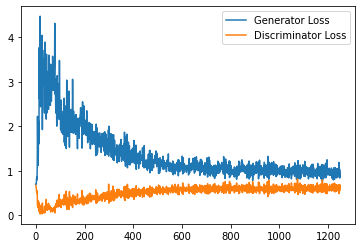

Step 25500: Generator loss: 0.9787883914709091, discriminator loss: 0.6030612581372261


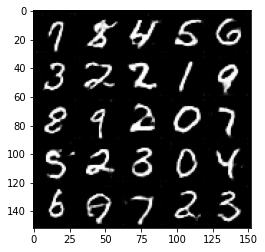

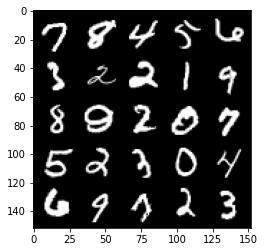

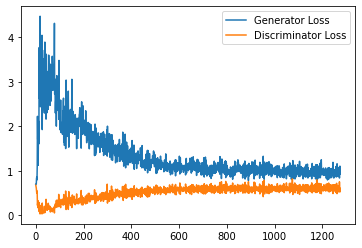

Step 26000: Generator loss: 0.9568659086227417, discriminator loss: 0.608523219704628


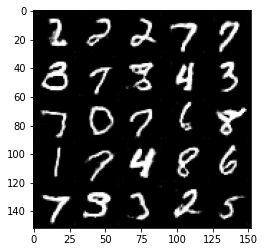

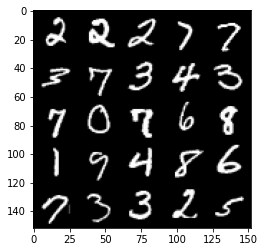

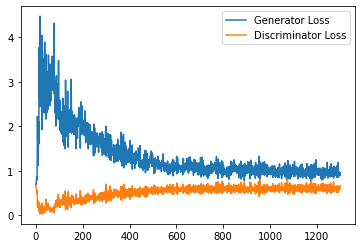

Step 26500: Generator loss: 0.9757133021354675, discriminator loss: 0.6074503238201141


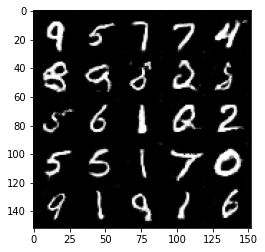

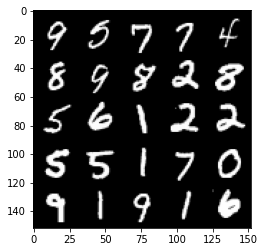

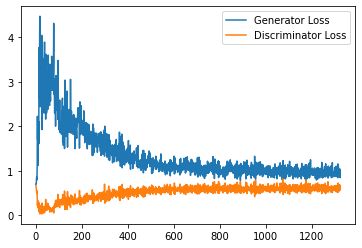

Step 27000: Generator loss: 0.9807992330789566, discriminator loss: 0.6060216308236123


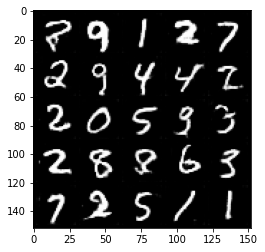

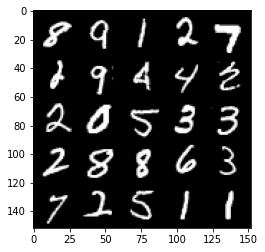

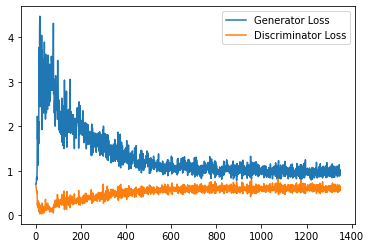

Step 27500: Generator loss: 0.957295504808426, discriminator loss: 0.606886002600193


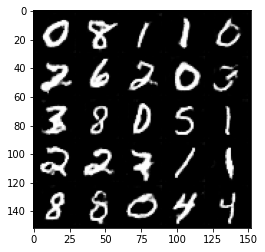

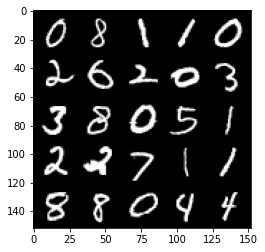

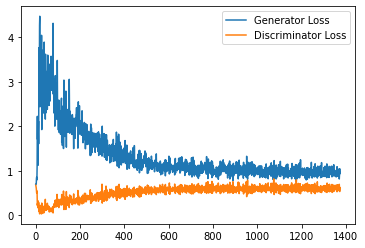

Step 28000: Generator loss: 0.9899970693588257, discriminator loss: 0.601691714823246


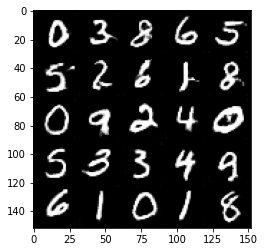

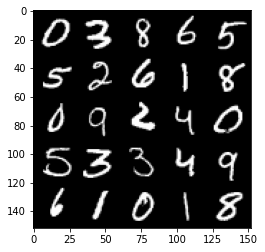

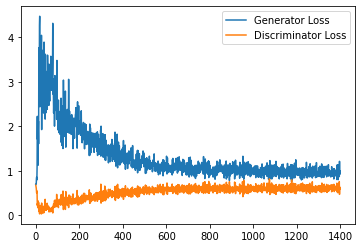

Step 28500: Generator loss: 0.9724634490013122, discriminator loss: 0.6068577843904496


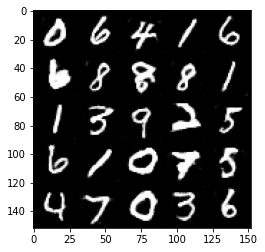

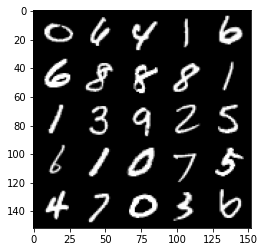

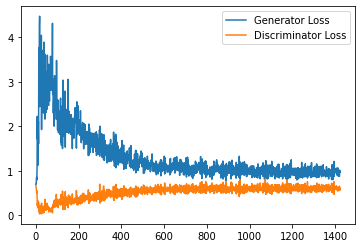

Step 29000: Generator loss: 0.9655339233875274, discriminator loss: 0.6097958483695984


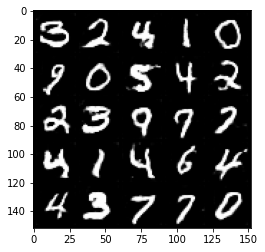

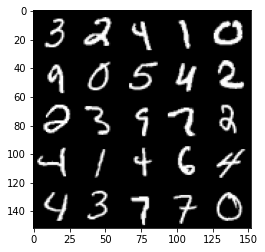

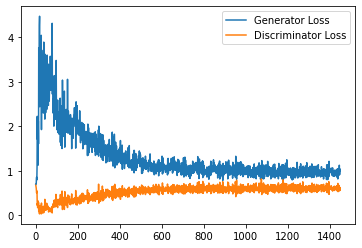

Step 29500: Generator loss: 0.9671898324489594, discriminator loss: 0.6032805070877075


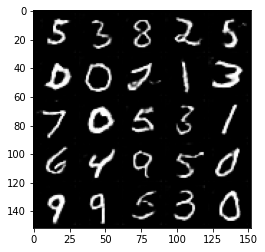

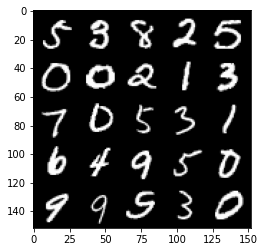

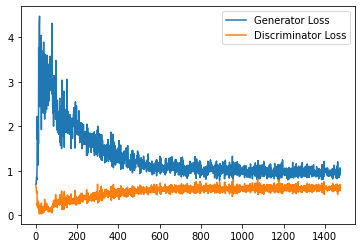

Step 30000: Generator loss: 0.9684159144163131, discriminator loss: 0.6054202760457993


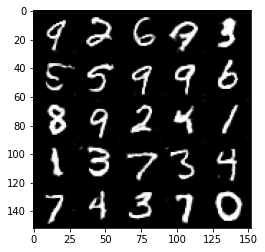

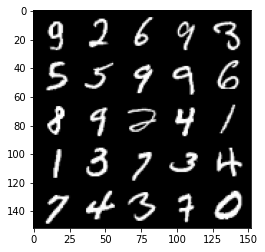

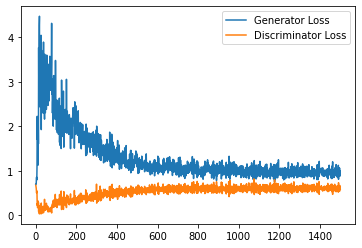

Step 30500: Generator loss: 0.9656897650957108, discriminator loss: 0.6111089255213737


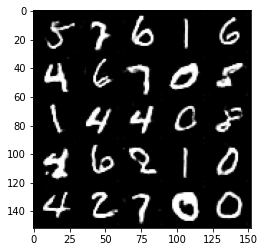

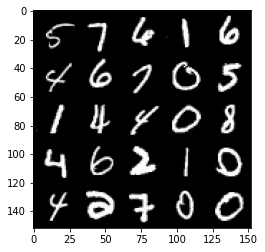

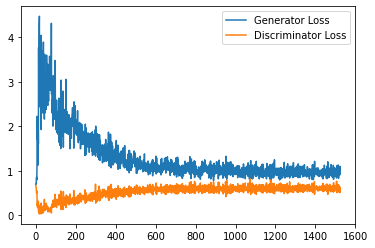

Step 31000: Generator loss: 0.9488856412172317, discriminator loss: 0.6108705987930297


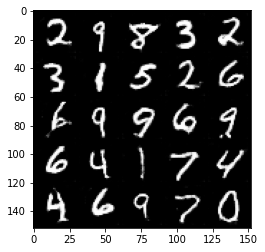

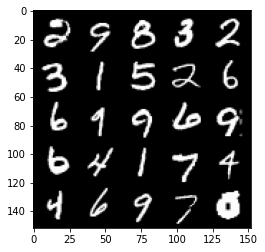

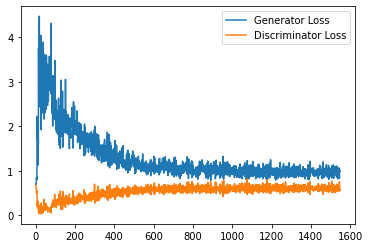

Step 31500: Generator loss: 0.9777083076238632, discriminator loss: 0.6174844971299172


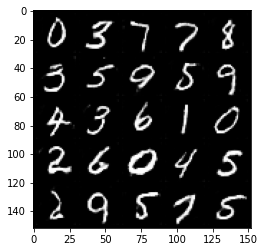

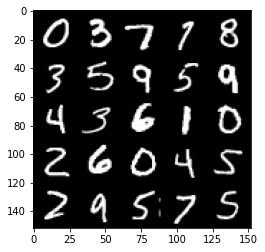

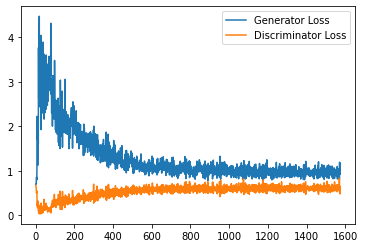

Step 32000: Generator loss: 0.9723682796955109, discriminator loss: 0.614156211078167


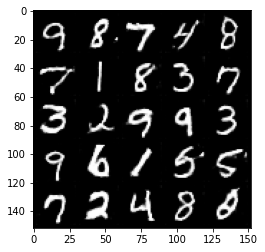

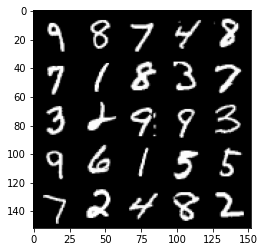

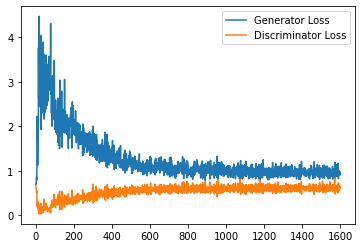

Step 32500: Generator loss: 0.9657130905389786, discriminator loss: 0.6075482484698296


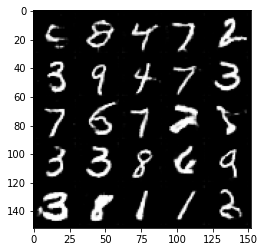

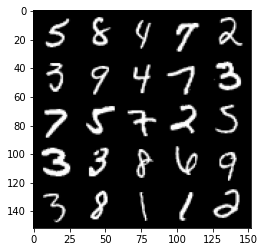

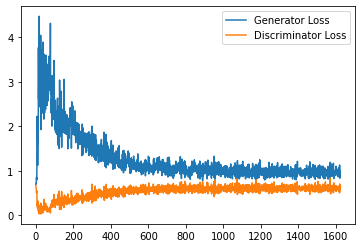

Step 33000: Generator loss: 0.9787183281183243, discriminator loss: 0.608252886891365


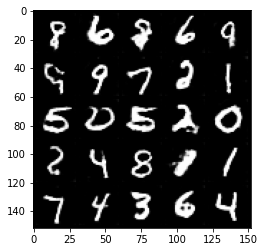

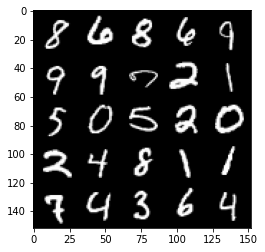

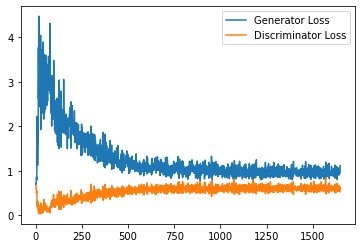

Step 33500: Generator loss: 0.9747110781669617, discriminator loss: 0.6159278536438942


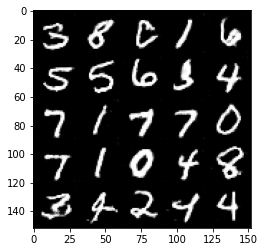

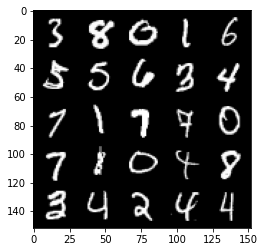

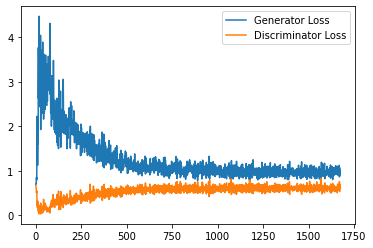

Step 34000: Generator loss: 0.9770334773063659, discriminator loss: 0.6002282158136368


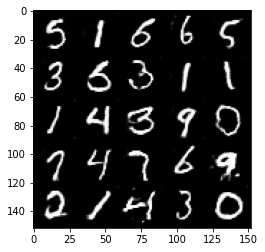

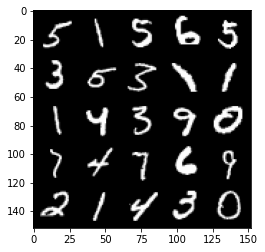

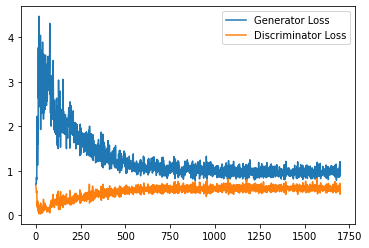

Step 34500: Generator loss: 0.9849031100273132, discriminator loss: 0.6065302469730377


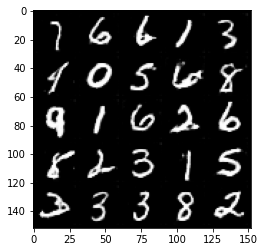

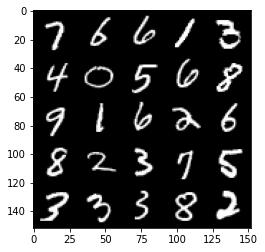

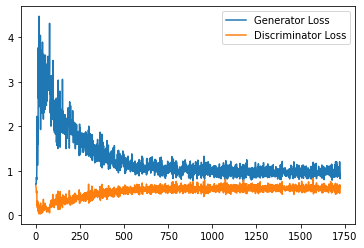

Step 35000: Generator loss: 0.9737744462490082, discriminator loss: 0.606462610244751


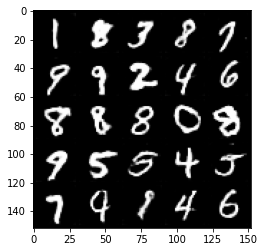

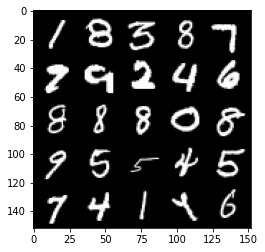

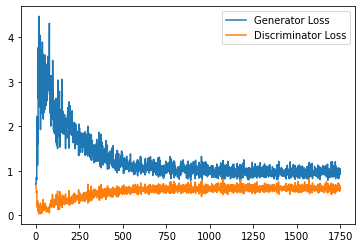

Step 35500: Generator loss: 0.9722973786592484, discriminator loss: 0.5998670719861984


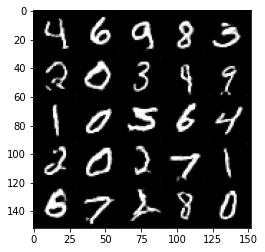

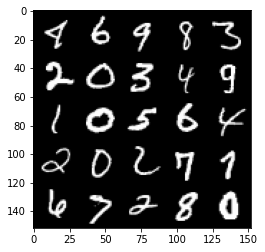

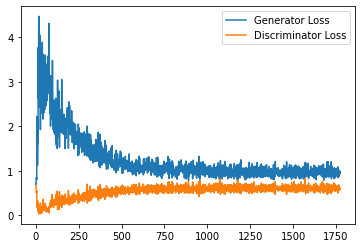

Step 36000: Generator loss: 0.9679617054462433, discriminator loss: 0.6012065851092339


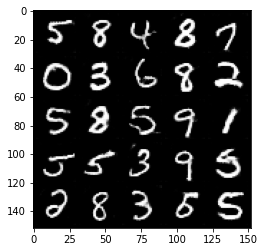

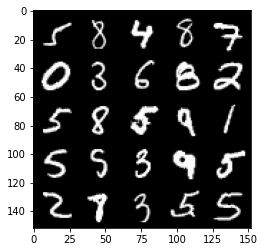

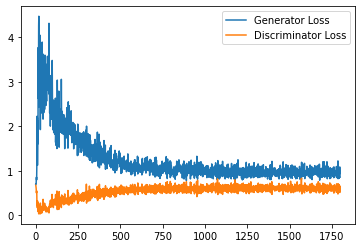

Step 36500: Generator loss: 0.9717111607789993, discriminator loss: 0.6026832740306854


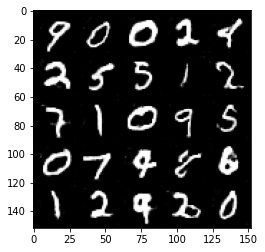

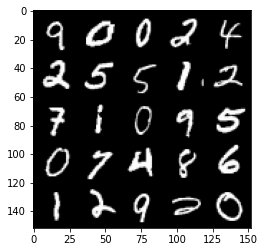

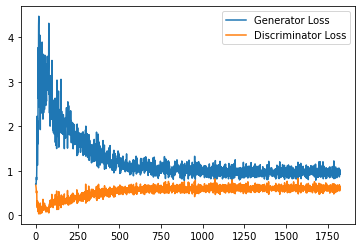

Step 37000: Generator loss: 0.9771006963253022, discriminator loss: 0.6048761979937554


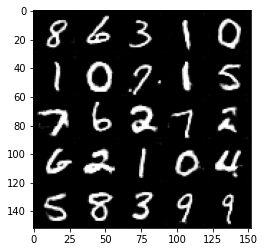

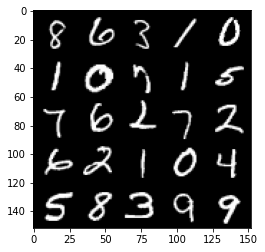

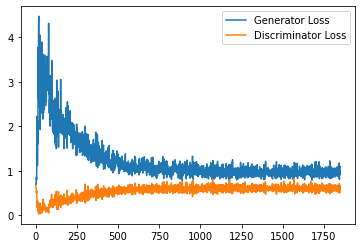

Step 37500: Generator loss: 0.9538715455532074, discriminator loss: 0.6064503028988838


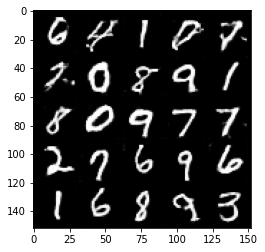

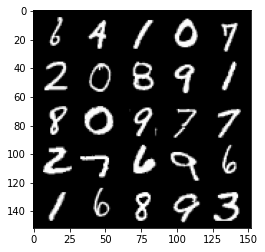

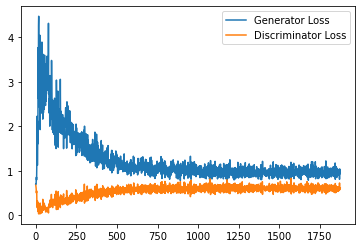

Step 38000: Generator loss: 0.9887987207174301, discriminator loss: 0.5959234691858292


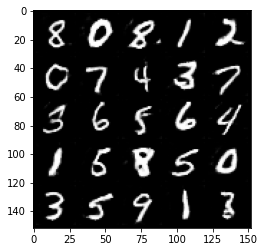

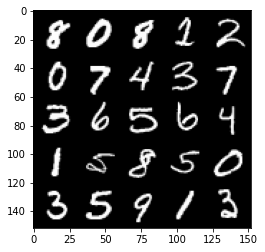

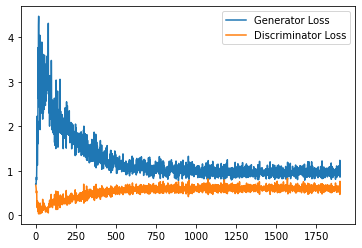

Step 38500: Generator loss: 0.9828983881473541, discriminator loss: 0.5994593656659126


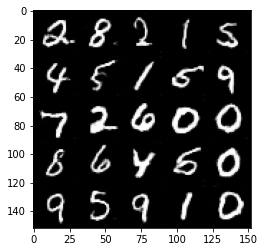

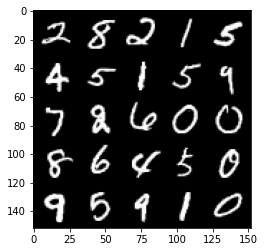

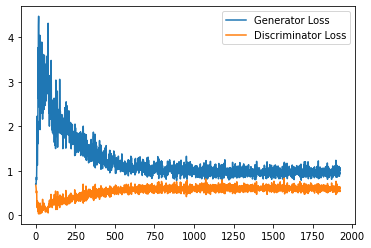

Step 39000: Generator loss: 0.9719427250623703, discriminator loss: 0.5962791618108749


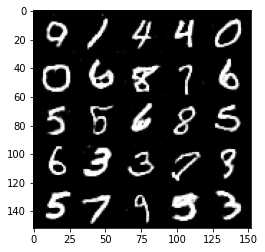

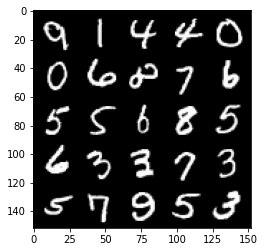

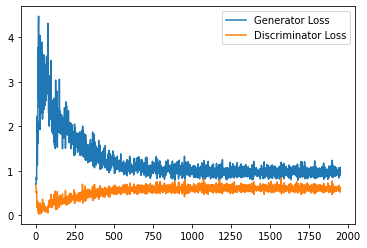

Step 39500: Generator loss: 0.9823711794614792, discriminator loss: 0.600151087641716


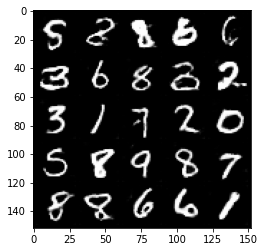

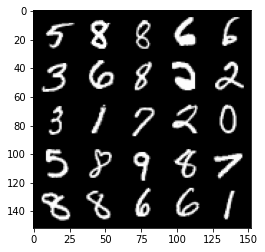

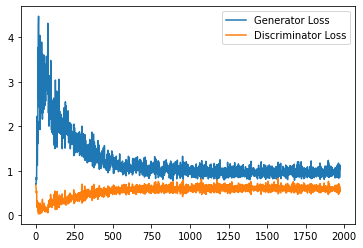

Step 40000: Generator loss: 0.9738906016349792, discriminator loss: 0.5981780095100403


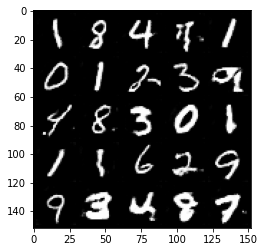

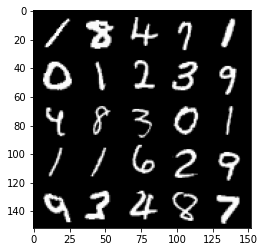

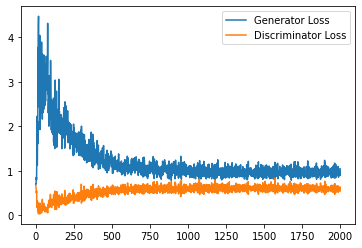

Step 40500: Generator loss: 0.9920439279079437, discriminator loss: 0.5941282517313957


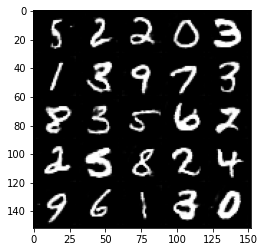

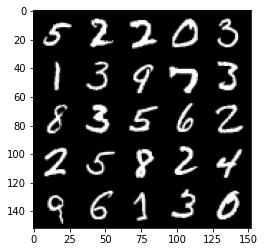

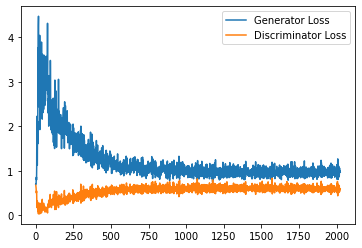

Step 41000: Generator loss: 0.9887145130634308, discriminator loss: 0.5929916395545006


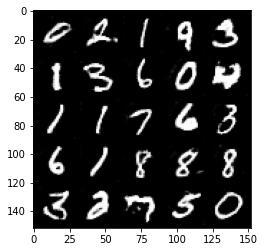

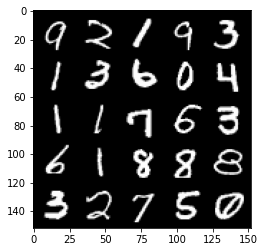

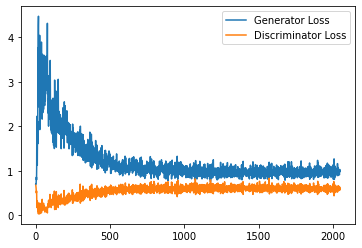

Step 41500: Generator loss: 0.9855985667705536, discriminator loss: 0.5967180616259575


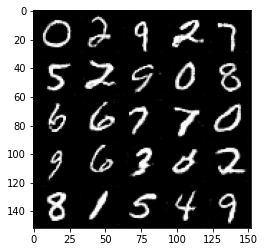

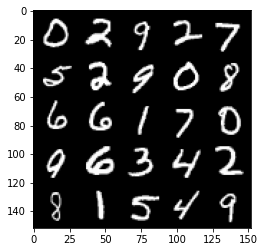

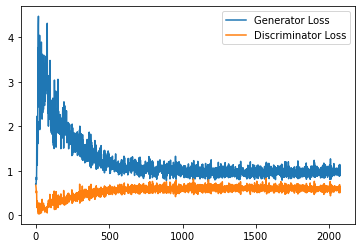

Step 42000: Generator loss: 1.012741970062256, discriminator loss: 0.5884396936893463


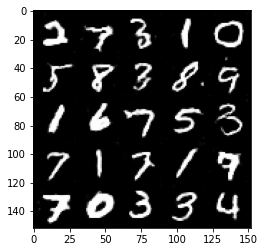

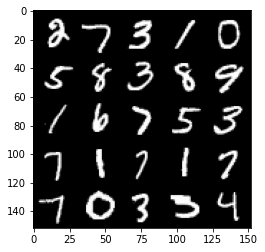

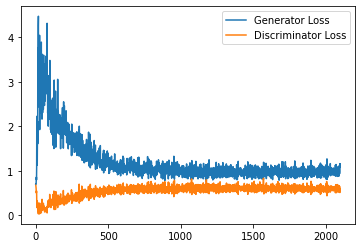

Step 42500: Generator loss: 0.9815900286436081, discriminator loss: 0.6000061275959014


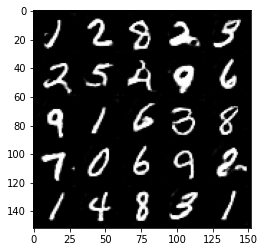

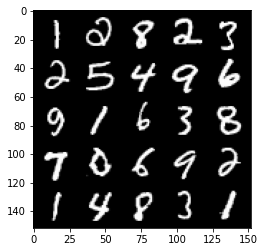

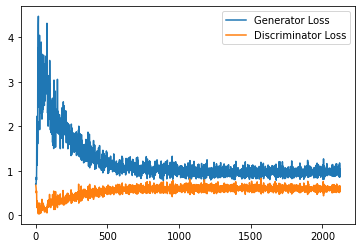

Step 43000: Generator loss: 1.0000275547504425, discriminator loss: 0.5895958508253097


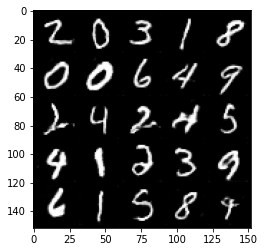

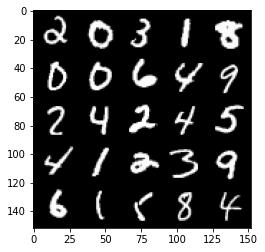

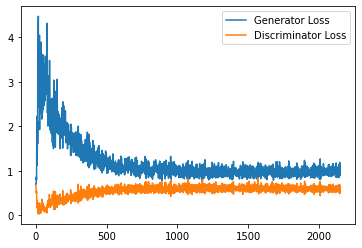

Step 43500: Generator loss: 0.9968457870483398, discriminator loss: 0.5898234638571739


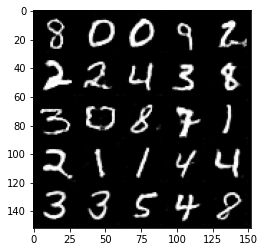

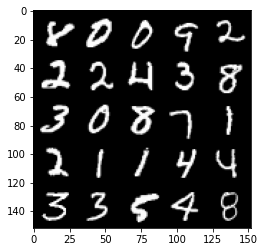

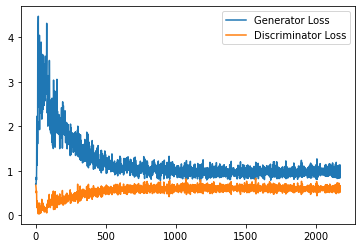

Step 44000: Generator loss: 0.998719049692154, discriminator loss: 0.5885630808472634


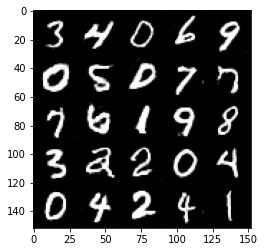

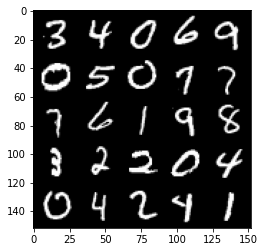

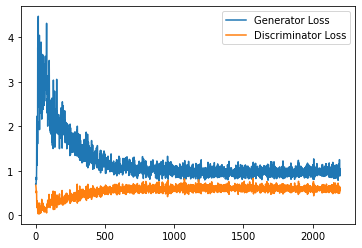

Step 44500: Generator loss: 1.0079171892404557, discriminator loss: 0.5810940706729889


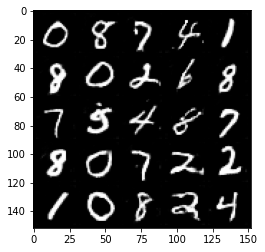

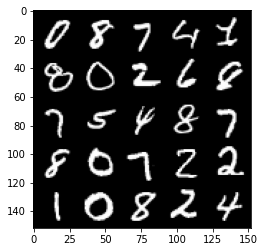

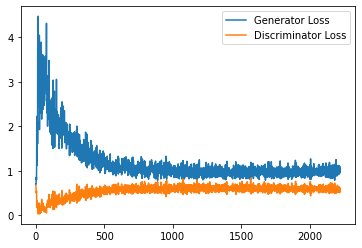

Step 45000: Generator loss: 1.008281116604805, discriminator loss: 0.5813510720133781


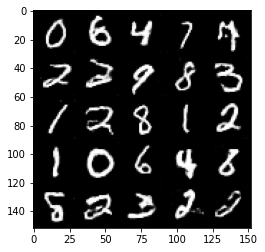

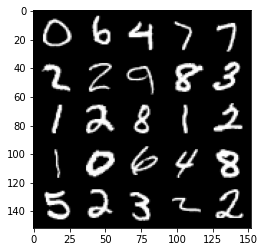

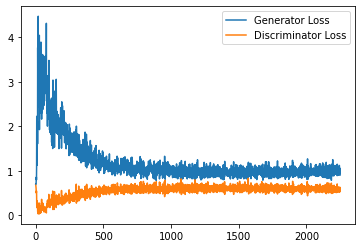

Step 45500: Generator loss: 1.0130485801696778, discriminator loss: 0.5786454674005509


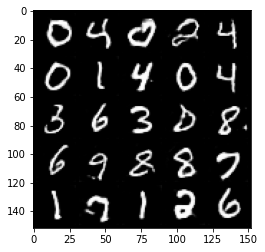

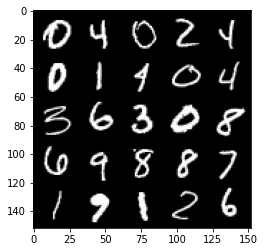

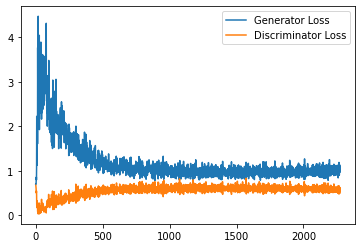

Step 46000: Generator loss: 0.9971702500581742, discriminator loss: 0.5804356338977814


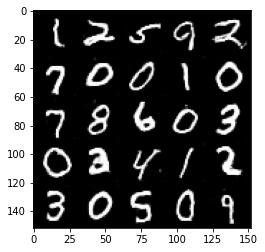

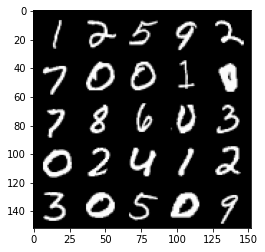

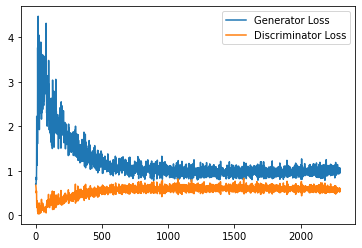

Step 46500: Generator loss: 1.0515033746957778, discriminator loss: 0.5747670358419419


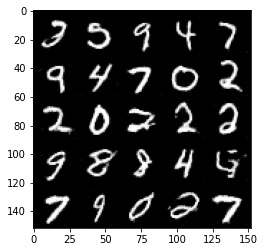

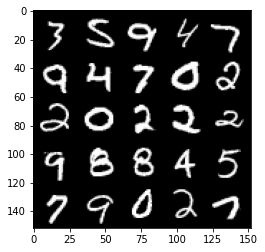

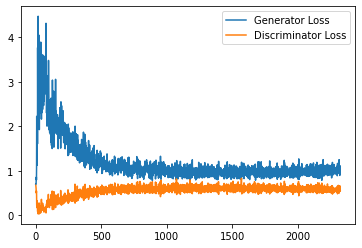

Step 47000: Generator loss: 1.0199401330947877, discriminator loss: 0.5766306891441345


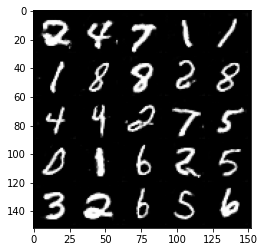

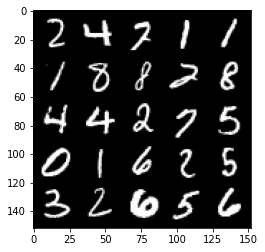

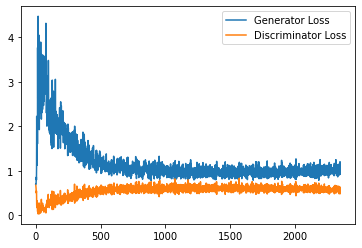

Step 47500: Generator loss: 1.0321825881004334, discriminator loss: 0.5784269783496857


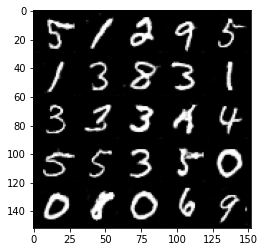

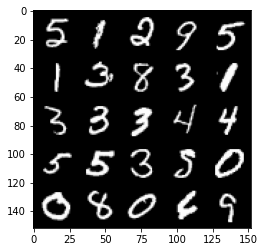

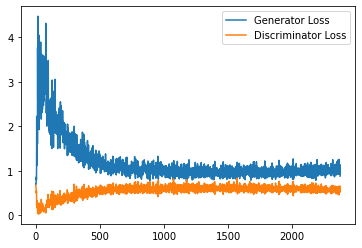

Step 48000: Generator loss: 1.0273198887109756, discriminator loss: 0.571568846821785


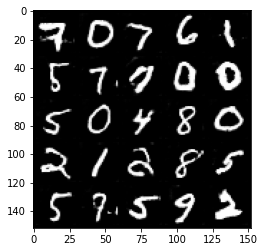

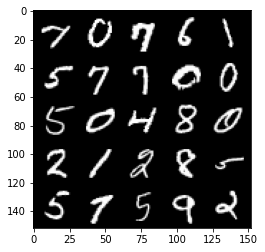

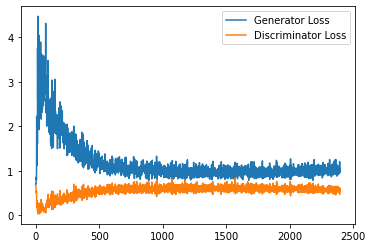

Step 48500: Generator loss: 1.034458808541298, discriminator loss: 0.5737833269834518


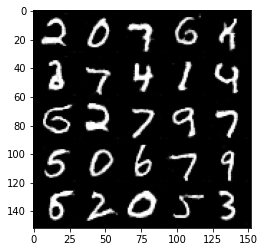

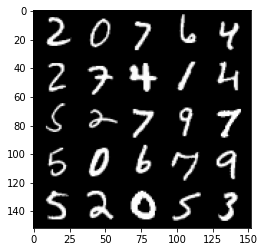

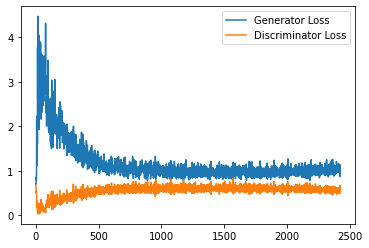

Step 49000: Generator loss: 1.0377146190404891, discriminator loss: 0.5671829466819763


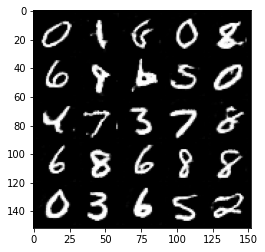

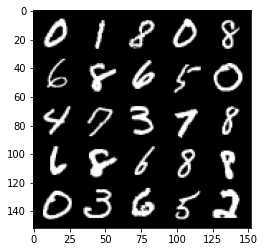

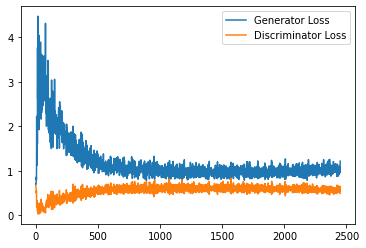

Step 49500: Generator loss: 1.0460277152061463, discriminator loss: 0.5718394029736519


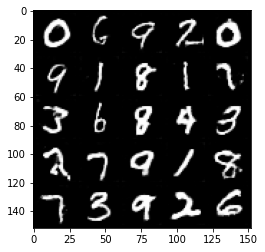

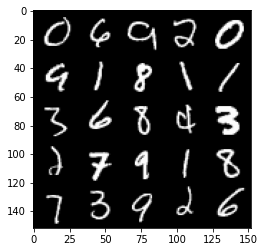

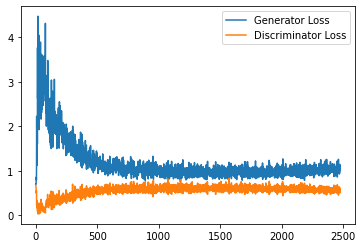

Step 50000: Generator loss: 1.0346450071334838, discriminator loss: 0.569179694890976


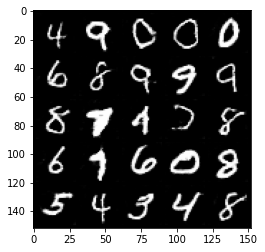

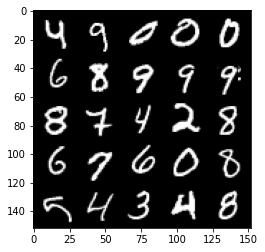

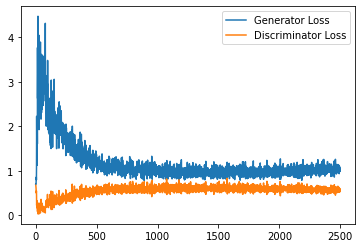

Step 50500: Generator loss: 1.0479991216659545, discriminator loss: 0.5665776259303092


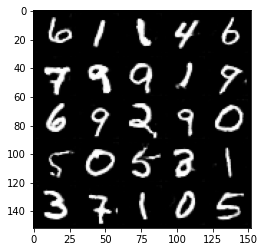

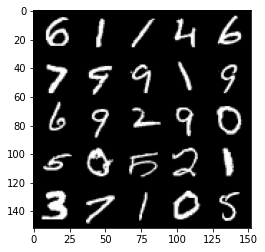

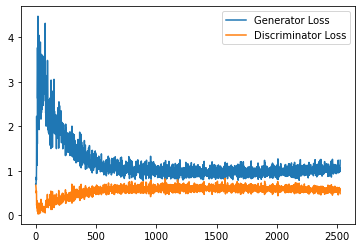

Step 51000: Generator loss: 1.0376012760400772, discriminator loss: 0.5706744573116302


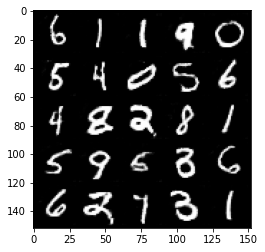

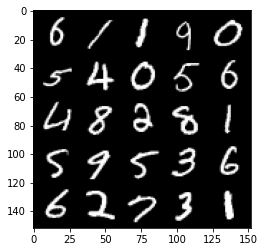

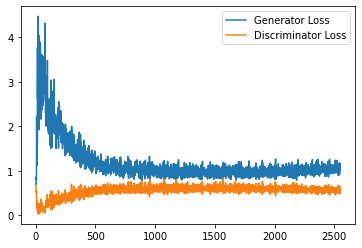

Step 51500: Generator loss: 1.0526915459632873, discriminator loss: 0.566294185936451


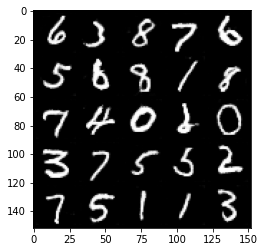

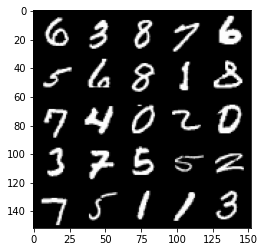

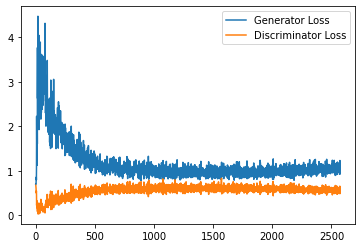

Step 52000: Generator loss: 1.0715970598459243, discriminator loss: 0.5658992589116096


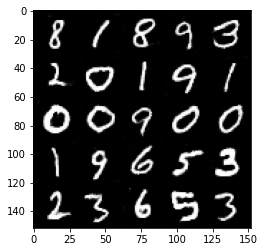

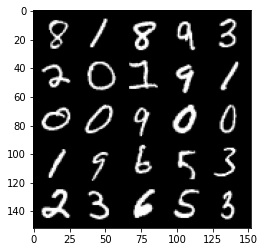

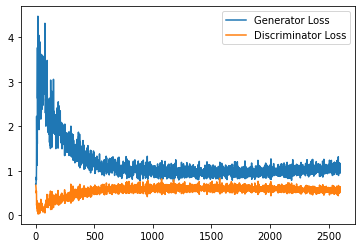

Step 52500: Generator loss: 1.0571836993694306, discriminator loss: 0.5644971036911011


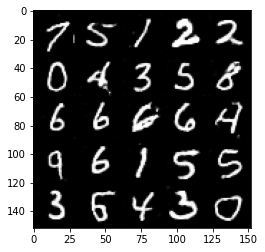

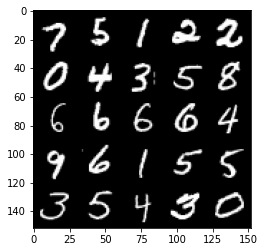

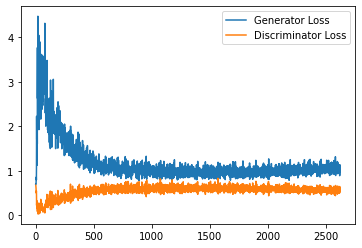

Step 53000: Generator loss: 1.045132759332657, discriminator loss: 0.5650955237746239


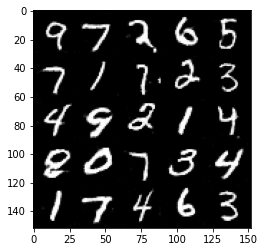

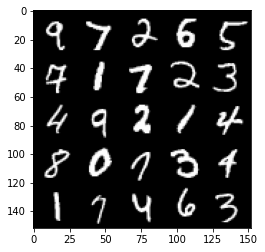

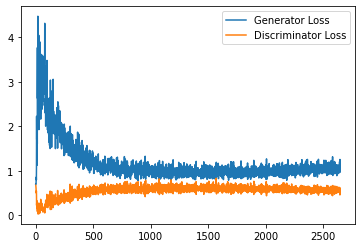

Step 53500: Generator loss: 1.0693071531057359, discriminator loss: 0.5625097753405571


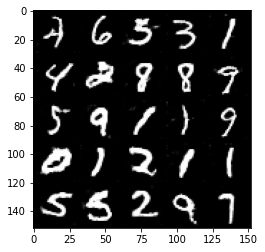

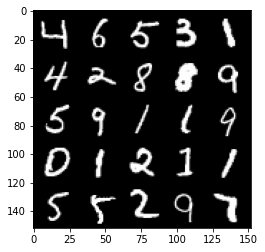

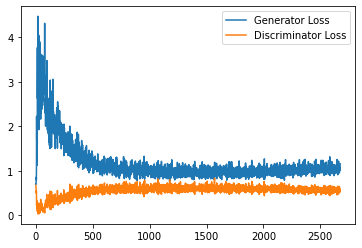

Step 54000: Generator loss: 1.0596899547576903, discriminator loss: 0.5612325760126113


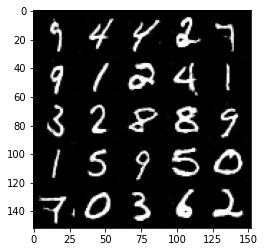

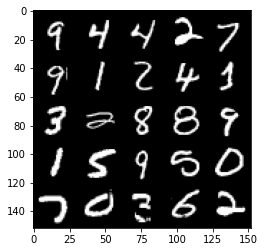

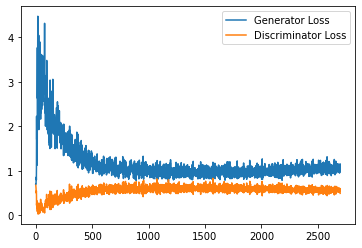

Step 54500: Generator loss: 1.0709537523984909, discriminator loss: 0.5597107693552971


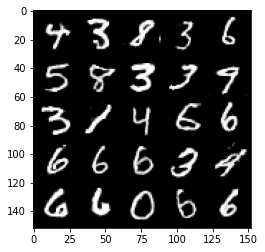

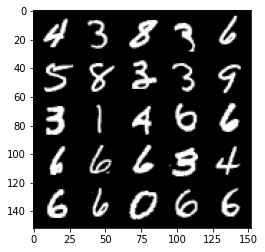

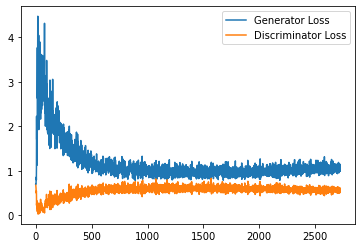

Step 55000: Generator loss: 1.0828881330490112, discriminator loss: 0.5569672248363495


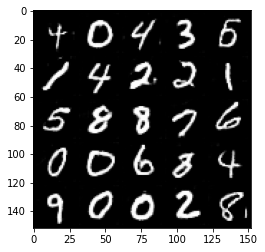

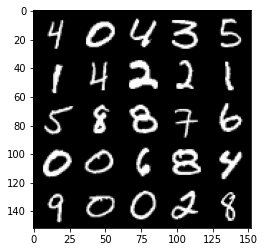

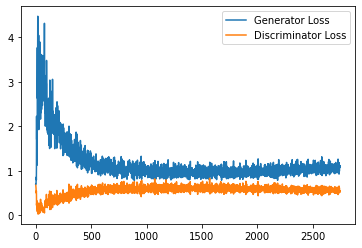

Step 55500: Generator loss: 1.0758920758962631, discriminator loss: 0.5568033979535103


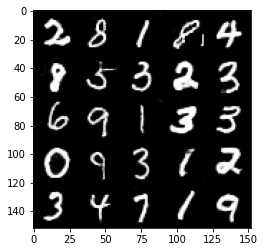

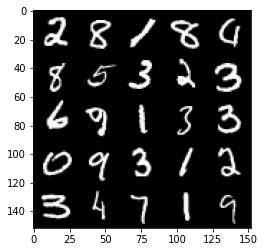

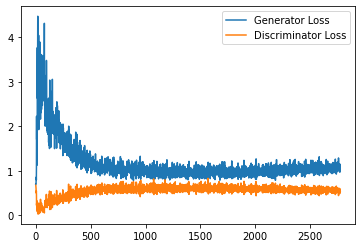

Step 56000: Generator loss: 1.0698348242044449, discriminator loss: 0.5649194375276566


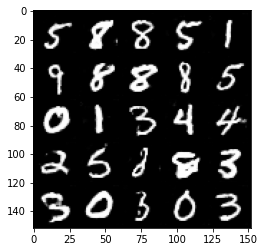

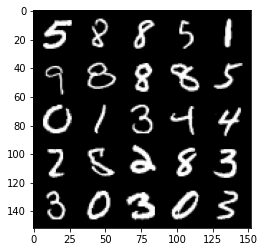

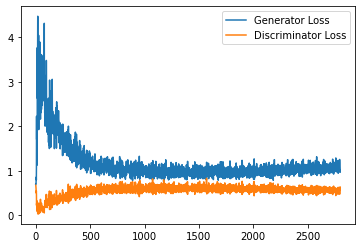

Step 56500: Generator loss: 1.0816996413469315, discriminator loss: 0.5602151449918747


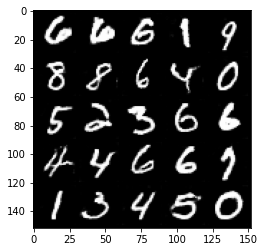

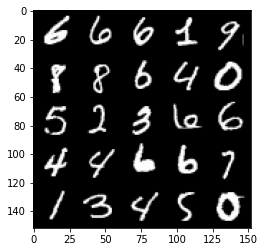

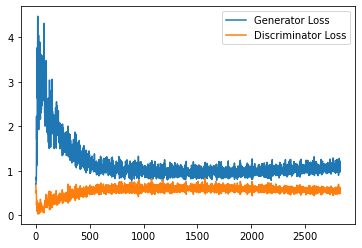

Step 57000: Generator loss: 1.090655717253685, discriminator loss: 0.5524967015385628


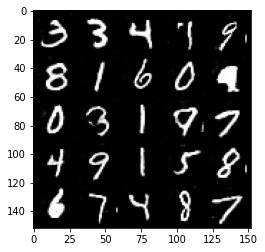

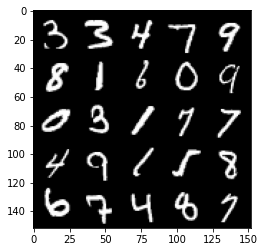

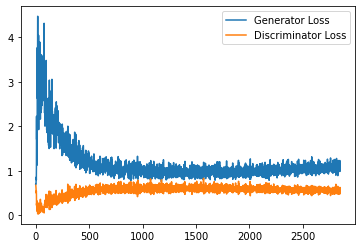

Step 57500: Generator loss: 1.0844504681825637, discriminator loss: 0.5594673077464104


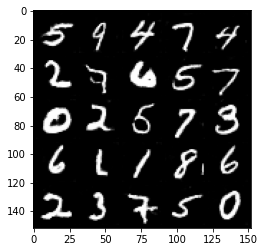

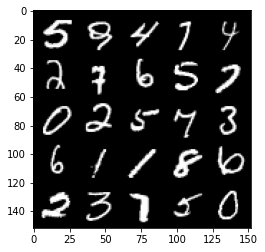

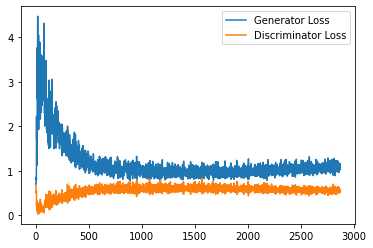

Step 58000: Generator loss: 1.0686992288827897, discriminator loss: 0.5575565292835235


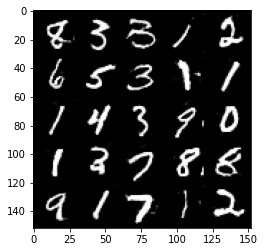

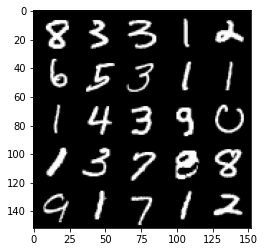

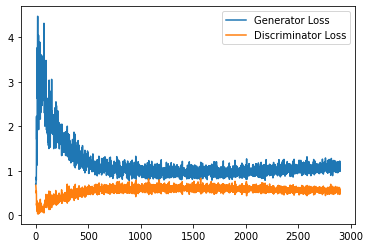

Step 58500: Generator loss: 1.1192508776187897, discriminator loss: 0.5536137046813965


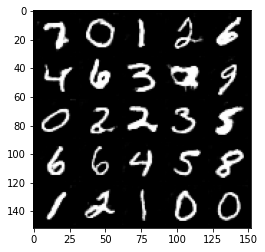

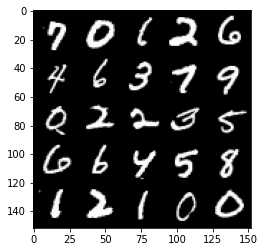

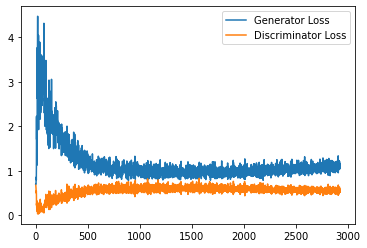

Step 59000: Generator loss: 1.073251116514206, discriminator loss: 0.5560193452835083


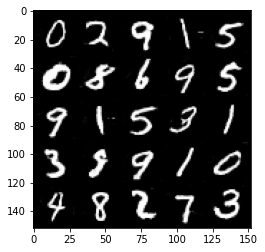

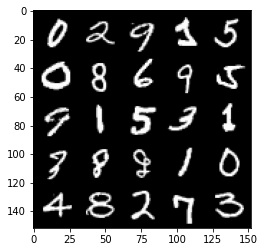

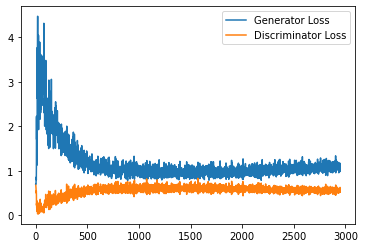

Step 59500: Generator loss: 1.09424913084507, discriminator loss: 0.5525397214889526


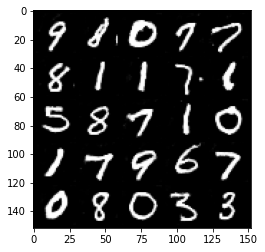

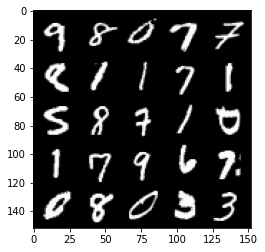

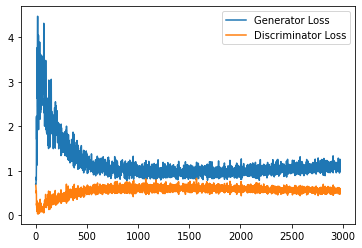

Step 60000: Generator loss: 1.0981892189979554, discriminator loss: 0.5503948032855988


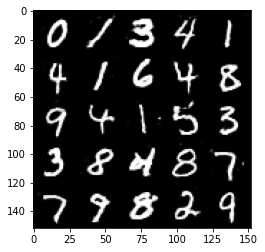

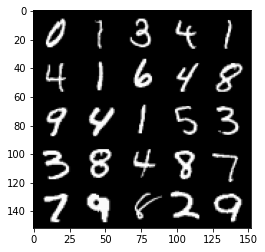

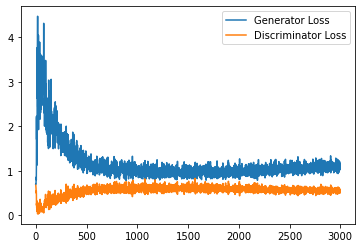

Step 60500: Generator loss: 1.1000883866548539, discriminator loss: 0.5499765179753303


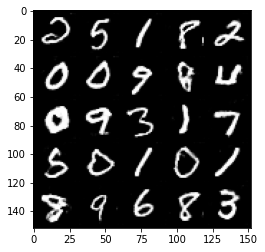

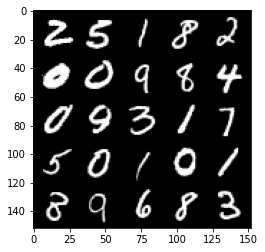

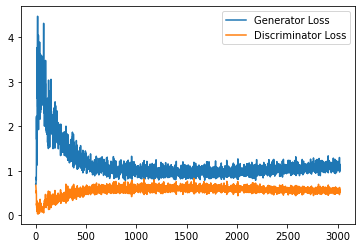

Step 61000: Generator loss: 1.09899245595932, discriminator loss: 0.5563401802778244


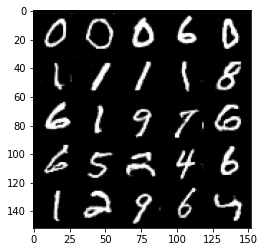

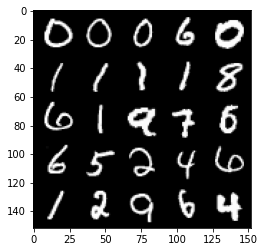

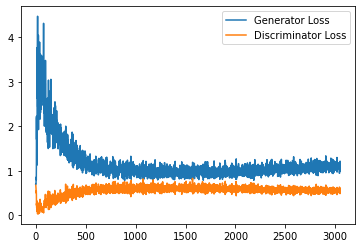

Step 61500: Generator loss: 1.1139494647979737, discriminator loss: 0.5524590954780578


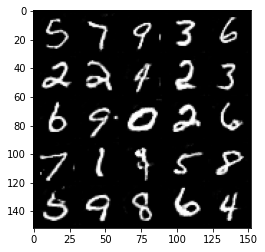

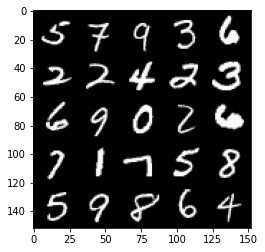

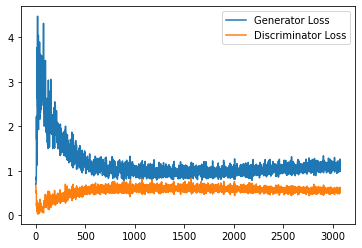

Step 62000: Generator loss: 1.1136844681501388, discriminator loss: 0.5475804466605186


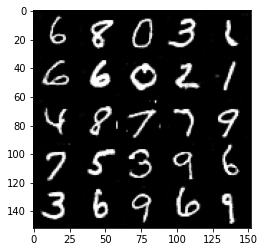

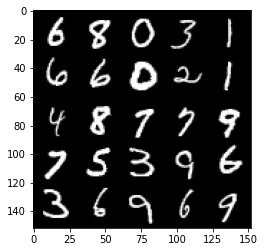

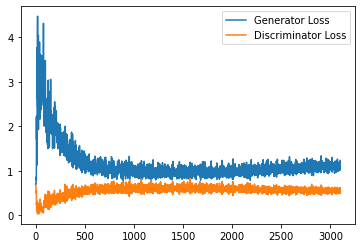

Step 62500: Generator loss: 1.1005228505134583, discriminator loss: 0.5495867220759392


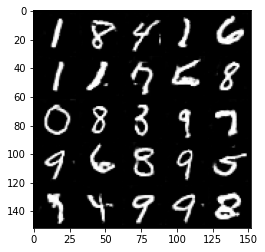

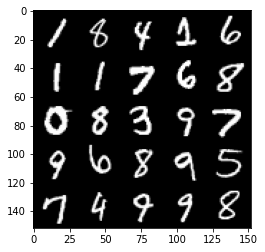

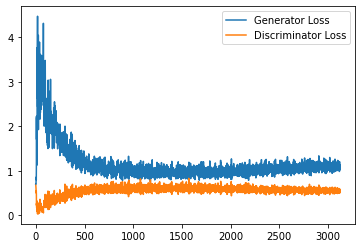

Step 63000: Generator loss: 1.1061645658016206, discriminator loss: 0.5509370834827423


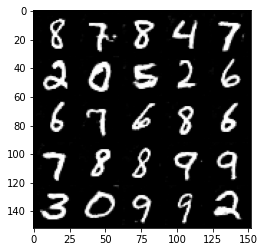

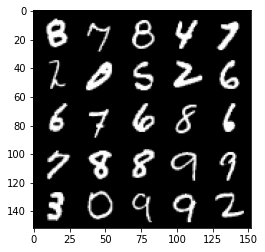

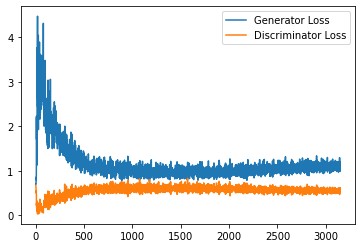

Step 63500: Generator loss: 1.1272603253126143, discriminator loss: 0.5441663488149643


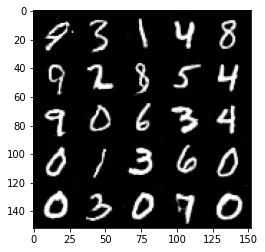

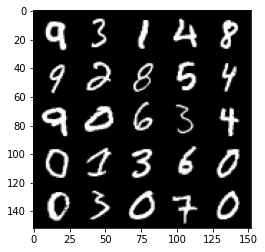

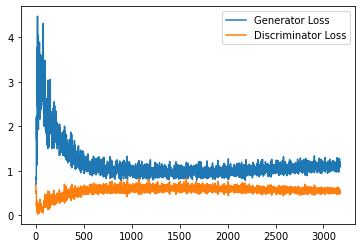

Step 64000: Generator loss: 1.1144230413436889, discriminator loss: 0.548280982375145


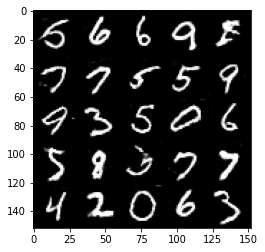

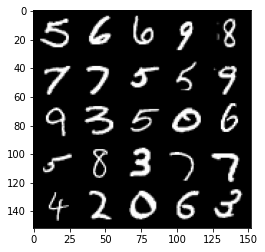

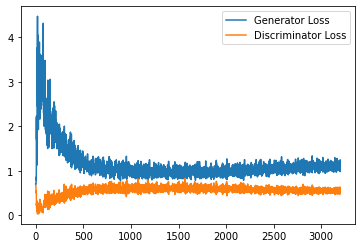

Step 64500: Generator loss: 1.1123134298324584, discriminator loss: 0.5496780762076378


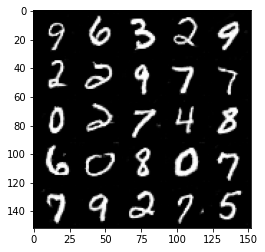

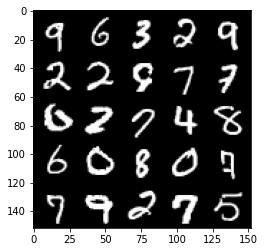

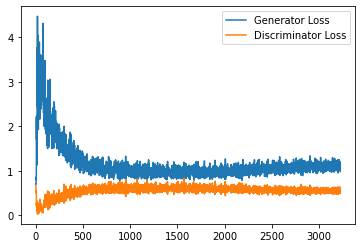

Step 65000: Generator loss: 1.134848322033882, discriminator loss: 0.546603532075882


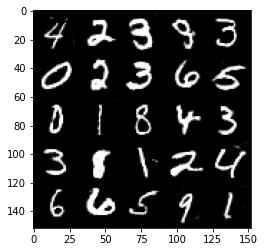

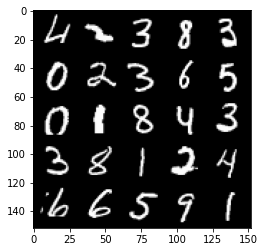

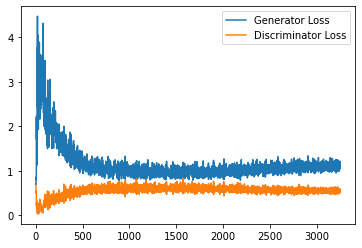

Step 65500: Generator loss: 1.114409611582756, discriminator loss: 0.5435132353901863


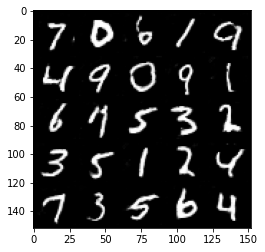

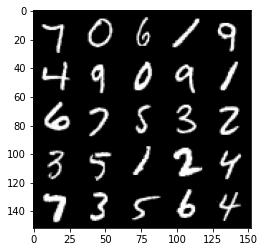

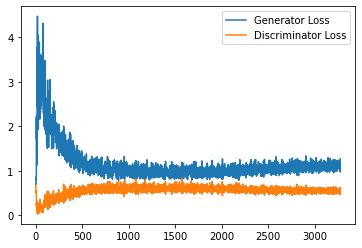

Step 66000: Generator loss: 1.1247415245771408, discriminator loss: 0.5488117160797119


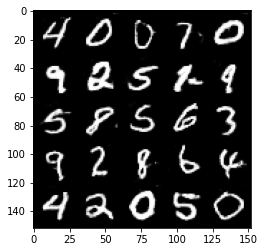

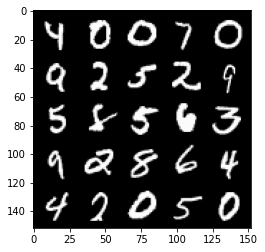

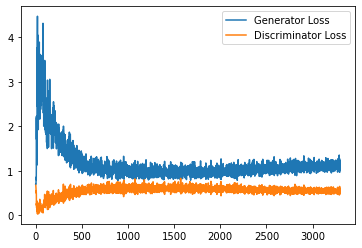

Step 66500: Generator loss: 1.1541591147184371, discriminator loss: 0.5547940053939819


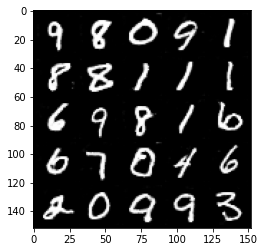

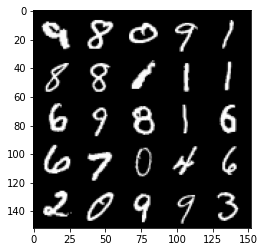

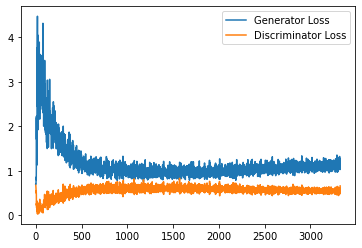

Step 67000: Generator loss: 1.0983429580926896, discriminator loss: 0.5467427450418473


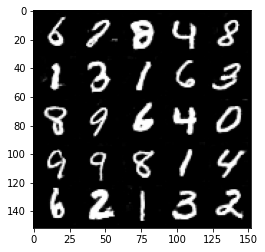

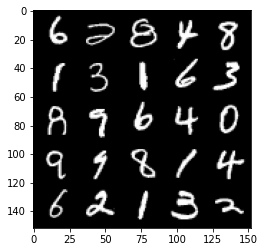

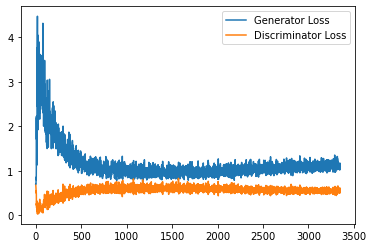

Step 67500: Generator loss: 1.1171168596744538, discriminator loss: 0.547257677435875


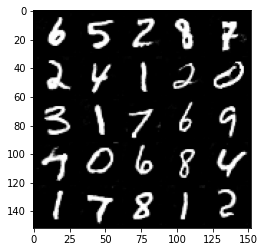

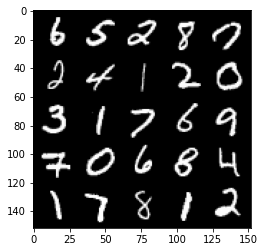

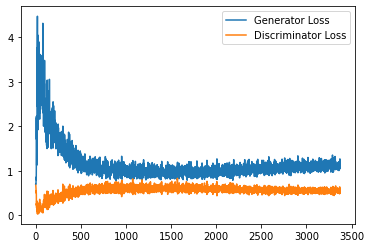

Step 68000: Generator loss: 1.1169792337417603, discriminator loss: 0.5523111248612403


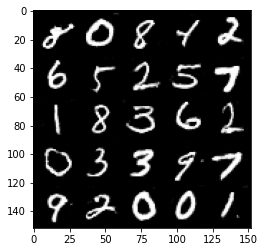

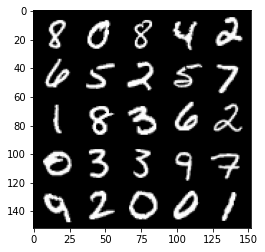

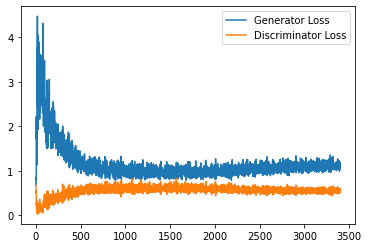

Step 68500: Generator loss: 1.1302639602422715, discriminator loss: 0.5501763418912887


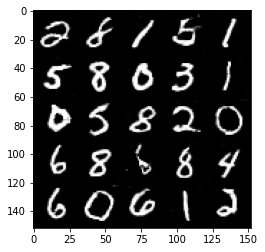

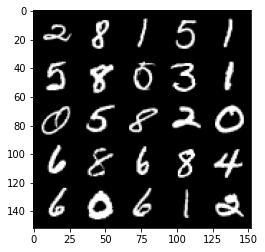

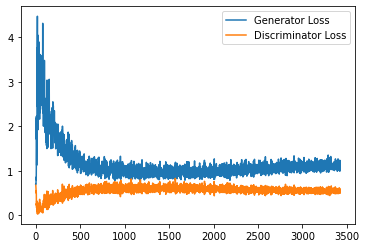

Step 69000: Generator loss: 1.1202201027870178, discriminator loss: 0.5477927868962288


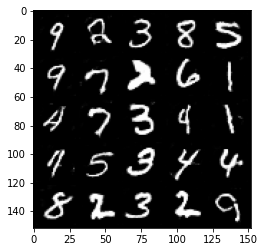

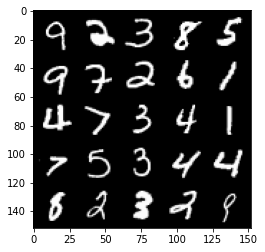

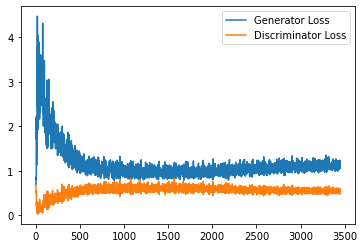

Step 69500: Generator loss: 1.132472673892975, discriminator loss: 0.5483423910140991


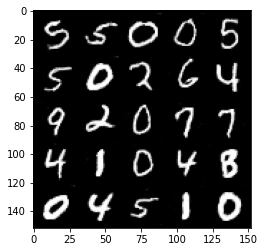

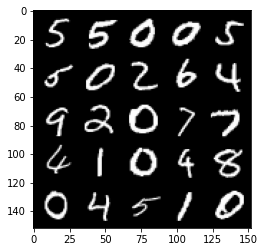

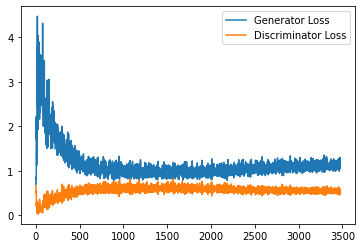

Step 70000: Generator loss: 1.1299281477928163, discriminator loss: 0.5450299552679062


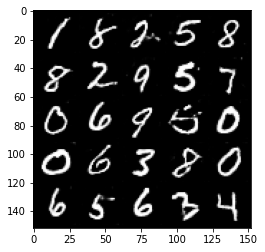

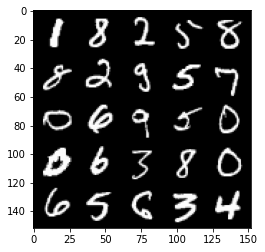

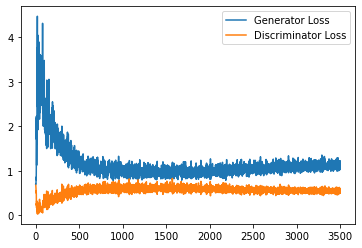

Step 70500: Generator loss: 1.1329925903081894, discriminator loss: 0.543326762855053


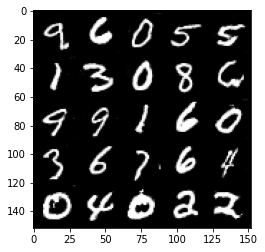

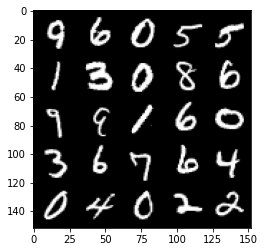

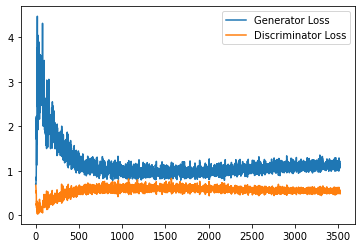

Step 71000: Generator loss: 1.1519798926115037, discriminator loss: 0.5452693908810615


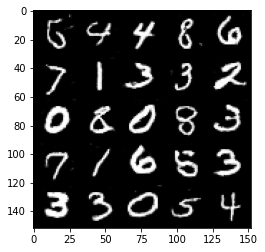

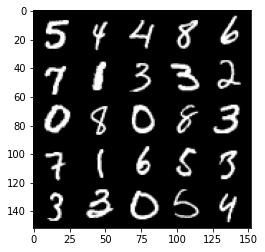

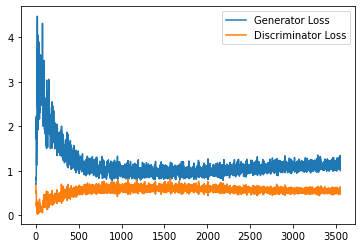

Step 71500: Generator loss: 1.1179890582561494, discriminator loss: 0.545597963154316


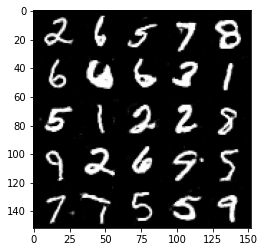

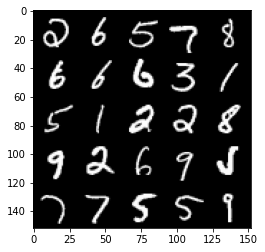

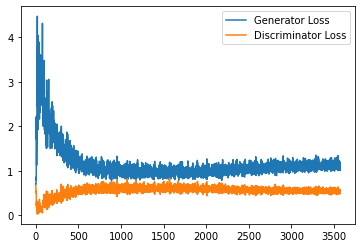

KeyboardInterrupt: 

In [26]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED CELL
cur_step = 0
generator_losses = []
discriminator_losses = []

#UNIT TEST NOTE: Initializations needed for grading
noise_and_labels = False
fake = False

fake_image_and_labels = False
real_image_and_labels = False
disc_fake_pred = False
disc_real_pred = False

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        # Flatten the batch of real images from the dataset
        real = real.to(device)

        one_hot_labels = get_one_hot_labels(labels.to(device), n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, mnist_shape[1], mnist_shape[2])

        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size 
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        
        # Now you can get the images from the generator
        # Steps: 1) Combine the noise vectors and the one-hot labels for the generator
        #        2) Generate the conditioned fake images
        
        #### START CODE HERE ####
        noise_and_labels = combine_vectors(fake_noise,one_hot_labels)
        fake = gen(noise_and_labels)
        #### END CODE HERE ####
        
        # Make sure that enough images were generated
        assert len(fake) == len(real)
        # Check that correct tensors were combined
        assert tuple(noise_and_labels.shape) == (cur_batch_size, fake_noise.shape[1] + one_hot_labels.shape[1])
        # It comes from the correct generator
        assert tuple(fake.shape) == (len(real), 1, 28, 28)

        # Now you can get the predictions from the discriminator
        # Steps: 1) Create the input for the discriminator
        #           a) Combine the fake images with image_one_hot_labels, 
        #              remember to detach the generator (.detach()) so you do not backpropagate through it
        #           b) Combine the real images with image_one_hot_labels
        #        2) Get the discriminator's prediction on the fakes as disc_fake_pred
        #        3) Get the discriminator's prediction on the reals as disc_real_pred
        
        #### START CODE HERE ####
        fake_image_and_labels = combine_vectors(fake,image_one_hot_labels)
        real_image_and_labels = combine_vectors(real,image_one_hot_labels)
        disc_fake_pred = disc(fake_image_and_labels)
        disc_real_pred = disc(real_image_and_labels)
        #### END CODE HERE ####
        
        # Make sure shapes are correct 
        assert tuple(fake_image_and_labels.shape) == (len(real), fake.detach().shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        assert tuple(real_image_and_labels.shape) == (len(real), real.shape[1] + image_one_hot_labels.shape[1], 28 ,28)
        # Make sure that enough predictions were made
        assert len(disc_real_pred) == len(real)
        # Make sure that the inputs are different
        assert torch.any(fake_image_and_labels != real_image_and_labels)
        # Shapes must match
        assert tuple(fake_image_and_labels.shape) == tuple(real_image_and_labels.shape)
        assert tuple(disc_fake_pred.shape) == tuple(disc_real_pred.shape)
        
        
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step() 

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        # This will error if you didn't concatenate your labels to your image correctly
        disc_fake_pred = disc(fake_image_and_labels)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]
        #

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
        elif cur_step == 0:
            print("Congratulations! If you've gotten here, it's working. Please let this train until you're happy with how the generated numbers look, and then go on to the exploration!")
        cur_step += 1

## Exploration
You can do a bit of exploration now!

In [27]:
# Before you explore, you should put the generator
# in eval mode, both in general and so that batch norm
# doesn't cause you issues and is using its eval statistics
gen = gen.eval()

#### Changing the Class Vector
You can generate some numbers with your new model! You can add interpolation as well to make it more interesting.

So starting from a image, you will produce intermediate images that look more and more like the ending image until you get to the final image. Your're basically morphing one image into another. You can choose what these two images will be using your conditional GAN.

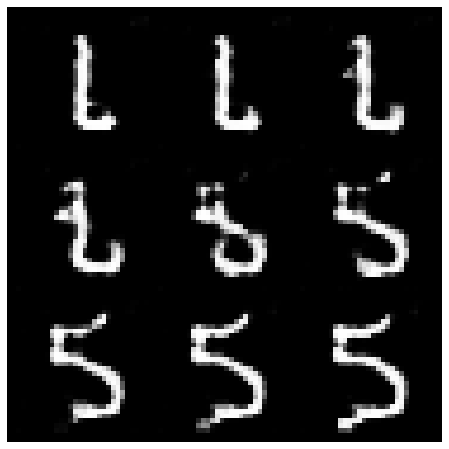

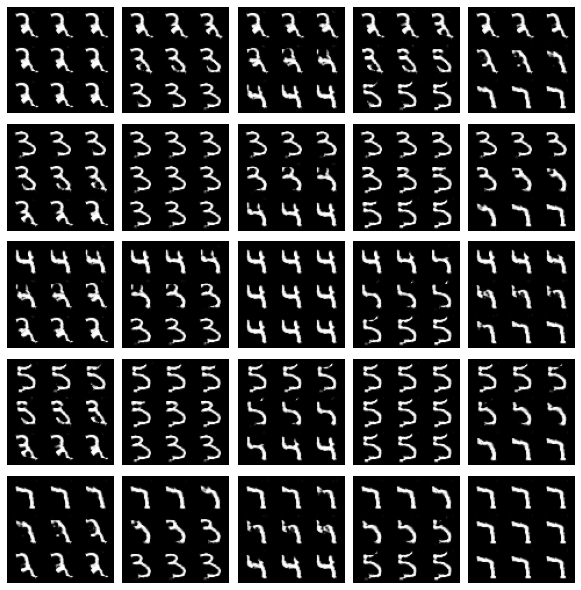

In [29]:
import math

### Change me! ###
n_interpolation = 9 # Choose the interpolation: how many intermediate images you want + 2 (for the start and end image)
interpolation_noise = get_noise(1, z_dim, device=device).repeat(n_interpolation, 1)

def interpolate_class(first_number, second_number):
    first_label = get_one_hot_labels(torch.Tensor([first_number]).long(), n_classes)
    second_label = get_one_hot_labels(torch.Tensor([second_number]).long(), n_classes)

    # Calculate the interpolation vector between the two labels
    percent_second_label = torch.linspace(0, 1, n_interpolation)[:, None]
    interpolation_labels = first_label * (1 - percent_second_label) + second_label * percent_second_label

    # Combine the noise and the labels
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_labels.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

### Change me! ###
start_plot_number = 1 # Choose the start digit
### Change me! ###
end_plot_number = 5 # Choose the end digit

plt.figure(figsize=(8, 8))
interpolate_class(start_plot_number, end_plot_number)
_ = plt.axis('off')

## Uncomment the following lines of code if you would like to visualize a set of pairwise class 
## interpolations for a collection of different numbers, all in a single grid of interpolations.
## You'll also see another visualization like this in the next code block!
plot_numbers = [2, 3, 4, 5, 7]
n_numbers = len(plot_numbers)
plt.figure(figsize=(8, 8))
for i, first_plot_number in enumerate(plot_numbers):
    for j, second_plot_number in enumerate(plot_numbers):
        plt.subplot(n_numbers, n_numbers, i * n_numbers + j + 1)
        interpolate_class(first_plot_number, second_plot_number)
        plt.axis('off')
plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
plt.show()
plt.close()

#### Changing the Noise Vector
Now, what happens if you hold the class constant, but instead you change the noise vector? You can also interpolate the noise vector and generate an image at each step.

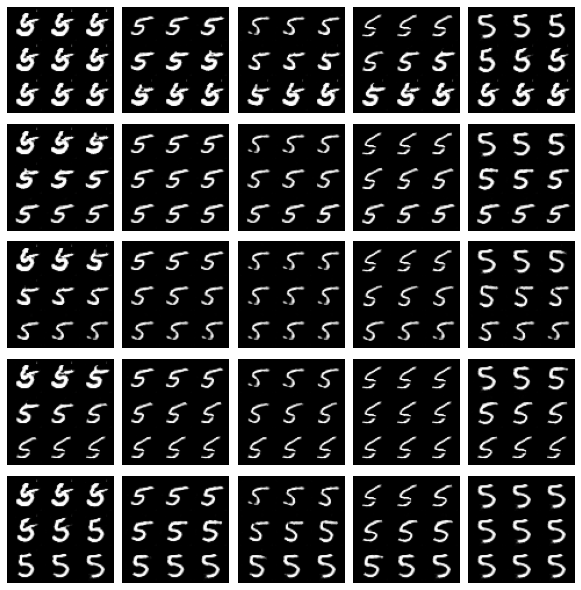

In [30]:
n_interpolation = 9 # How many intermediate images you want + 2 (for the start and end image)

# This time you're interpolating between the noise instead of the labels
interpolation_label = get_one_hot_labels(torch.Tensor([5]).long(), n_classes).repeat(n_interpolation, 1).float()

def interpolate_noise(first_noise, second_noise):
    # This time you're interpolating between the noise instead of the labels
    percent_first_noise = torch.linspace(0, 1, n_interpolation)[:, None].to(device)
    interpolation_noise = first_noise * percent_first_noise + second_noise * (1 - percent_first_noise)

    # Combine the noise and the labels again
    noise_and_labels = combine_vectors(interpolation_noise, interpolation_label.to(device))
    fake = gen(noise_and_labels)
    show_tensor_images(fake, num_images=n_interpolation, nrow=int(math.sqrt(n_interpolation)), show=False)

# Generate noise vectors to interpolate between
### Change me! ###
n_noise = 5 # Choose the number of noise examples in the grid
plot_noises = [get_noise(1, z_dim, device=device) for i in range(n_noise)]
plt.figure(figsize=(8, 8))
for i, first_plot_noise in enumerate(plot_noises):
    for j, second_plot_noise in enumerate(plot_noises):
        plt.subplot(n_noise, n_noise, i * n_noise + j + 1)
        interpolate_noise(first_plot_noise, second_plot_noise)
        plt.axis('off')
plt.subplots_adjust(top=1, bottom=0, left=0, right=1, hspace=0.1, wspace=0)
plt.show()
plt.close()